In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn as sns

In [2]:
men_data=pd.read_csv('men_raw_1_14_2.csv')
df=men_data.copy()

In [3]:
df=men_data.copy()

## General Score Analysis

### Distribution of average scores of athletes over the world

In [4]:
# Select the best performing atheletes in the world
scores = df.loc[:,['name','Country','Score','D_Score','E_Score']].groupby(['name','Country']).mean().sort_values('Score',ascending=False) # Mean scores of atheletes
scores.head()
scores.reset_index(inplace=True)
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Plot the scores
fig = px.scatter(scores, x='D_Score', y='E_Score',hover_name='name',color='Country')
fig.update_layout(title='Average Scores of Athletes')
fig.show()

### Distribution of average scores of athletes over the world

In [5]:
fig = make_subplots(rows=1, cols=3)
# Histogram for the first column
fig.add_trace(
    go.Histogram(x=scores['Score'], nbinsx=20, name='Score'),
    row=1, col=1
)

# Histogram for the second column
fig.add_trace(
    go.Histogram(x=scores['D_Score'], nbinsx=20, name='D_Score'),
    row=1, col=2
)
fig.add_trace(
    go.Histogram(x=scores['E_Score'], nbinsx=20, name='E_Score'),
    row=1, col=3
)
fig.update_layout(title_text="Distribution of Score, D_Score, and E_Score for men")
fig.update_xaxes(title_text="Score", row=1, col=1)
fig.update_xaxes(title_text="D_Score", row=1, col=2)
fig.update_xaxes(title_text="E_Score", row=1, col=3)
fig.update_yaxes(title_text="Count", row=1, col=1)
fig.show()

## Horizontal Bar

### Competing frequency for HB, with 5+ records

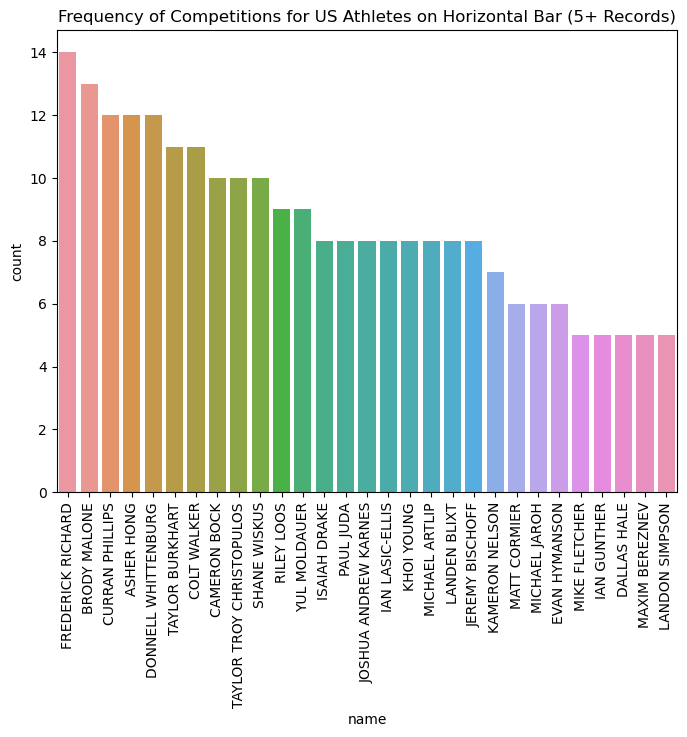

In [6]:
usa_hb_athletes = df[(df['Apparatus'] == 'HB') & (df['Country'] == 'USA')]
hb_athlete_competition_counts = usa_hb_athletes['name'].value_counts()
hb_frequent_competitors = hb_athlete_competition_counts[hb_athlete_competition_counts >= 5]
hb_frequent_competitors_data = usa_hb_athletes[usa_hb_athletes['name'].isin(hb_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
hb_competition_plot = sns.countplot(
    x='name', 
    data=hb_frequent_competitors_data, 
    order=hb_frequent_competitors.index
)
hb_competition_plot.set_xticklabels(hb_competition_plot.get_xticklabels(), rotation=90)
hb_competition_plot.set_title('Frequency of Competitions for US Athletes on Horizontal Bar (5+ Records)')
plt.show()

### D_Score VS E_Score for HB Atheletes with 5+ Records

Text(0.5, 1.0, 'E_Score vs D_Score for Horizontal Bar USA Athletes (5+ records)')

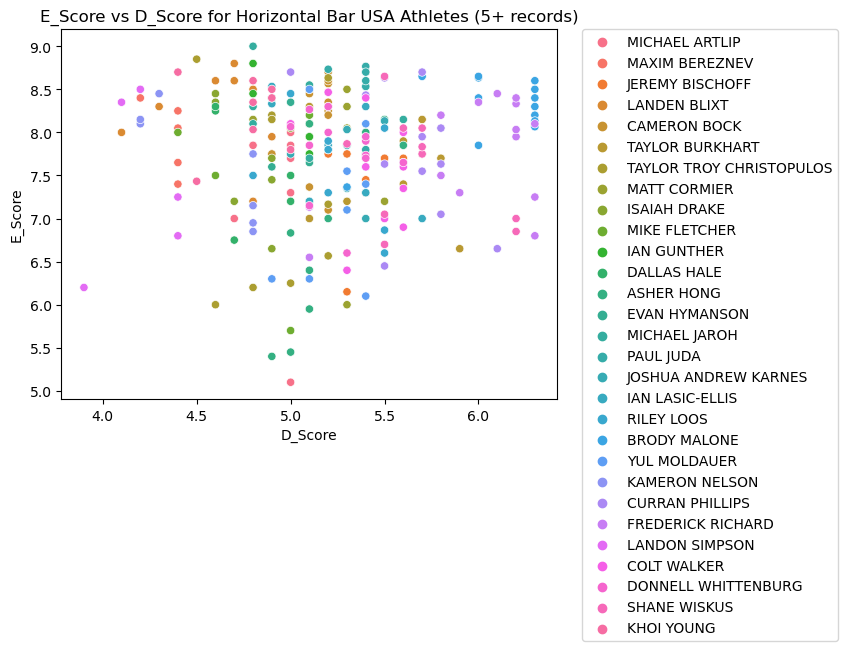

In [7]:
sns.scatterplot(data=hb_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Horizontal Bar USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

In [8]:
hb_athletes_df = hb_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
hb_athletes_df['Mean_Score'] = hb_athletes_df['Mean_Score'].round(2)
hb_athletes_df['Mean_D_Score'] = hb_athletes_df['Mean_D_Score'].round(2)
hb_athletes_df['Mean_E_Score'] = hb_athletes_df['Mean_E_Score'].round(2)
hb_athletes_df = hb_athletes_df.sort_values('Mean_Score', ascending=False)
hb_athletes_df.index = range(1, len(hb_athletes_df) + 1)
hb_athletes_df.head(10)

,name,Mean_Score,Mean_D_Score,Mean_E_Score,Record_Count
1,BRODY MALONE,14.37,6.08,8.29,13
2,PAUL JUDA,13.92,5.38,8.55,8
3,FREDERICK RICHARD,13.68,5.96,7.74,14
4,CURRAN PHILLIPS,13.41,5.62,7.79,12
5,MICHAEL JAROH,13.33,5.03,8.30,6
6,CAMERON BOCK,13.28,5.15,8.13,10
7,SHANE WISKUS,13.27,5.69,7.58,10
8,IAN GUNTHER,13.19,4.98,8.21,5
9,EVAN HYMANSON,13.17,5.03,8.13,6
10,TAYLOR BURKHART,13.07,5.48,7.59,11


### Score distribution of all competitors

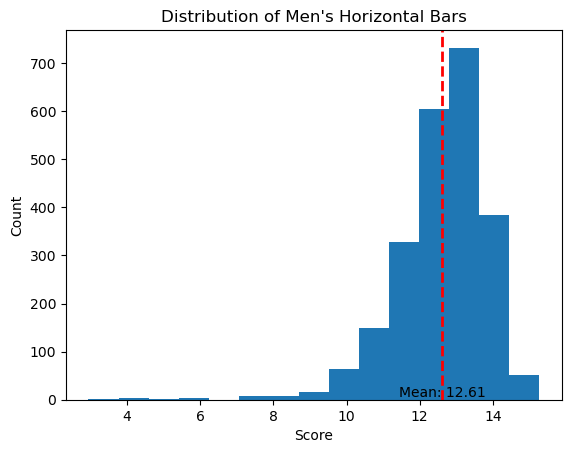

In [9]:
men_HB = men_data[men_data['Apparatus']=='HB']
men_HB_avg = men_HB['Score'].mean()
plt.hist(men_HB['Score'],bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Men's Horizontal Bars")
plt.axvline(men_HB_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_HB_avg, 0, f'Mean: {men_HB_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

### Score distribution of all competitors

Text(0.5, 1.0, "Box Plot Distribution of Men's Horizontal Bars")

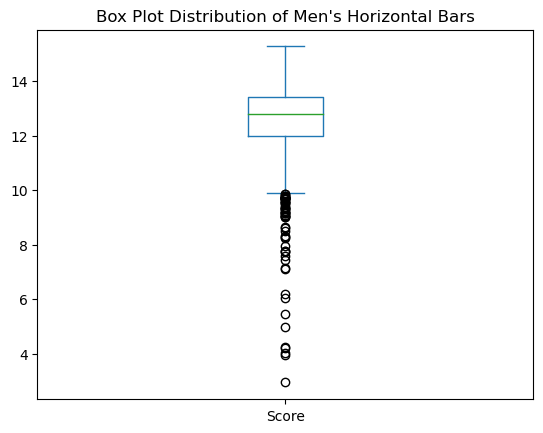

In [10]:
ax = men_HB['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Horizontal Bars")

## Pommel Horse

### Competing frequency for PH, with 5+ records

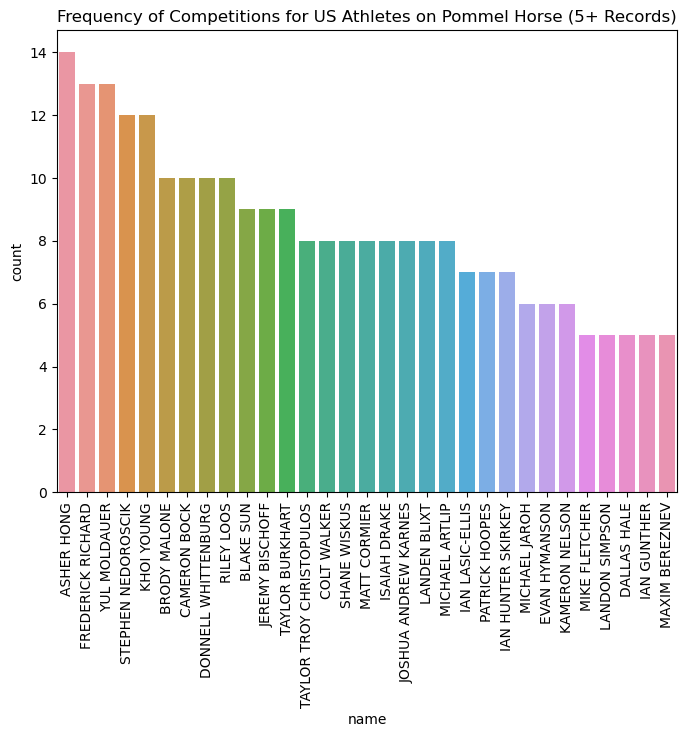

In [11]:
usa_ph_athletes = df[(df['Apparatus'] == 'PH') & (df['Country'] == 'USA')]
ph_athlete_competition_counts = usa_ph_athletes['name'].value_counts()
ph_frequent_competitors = ph_athlete_competition_counts[ph_athlete_competition_counts >= 5]
ph_frequent_competitors_data = usa_ph_athletes[usa_ph_athletes['name'].isin(ph_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
ph_competition_plot = sns.countplot(
    x='name', 
    data=ph_frequent_competitors_data, 
    order=ph_frequent_competitors.index
)
ph_competition_plot.set_xticklabels(ph_competition_plot.get_xticklabels(), rotation=90)
ph_competition_plot.set_title('Frequency of Competitions for US Athletes on Pommel Horse (5+ Records)')
plt.show()

### D_Score VS E_Score for PH Atheletes with 5+ Records

Text(0.5, 1.0, 'E_Score vs D_Score for Pommel Horse USA Athletes (5+ records)')

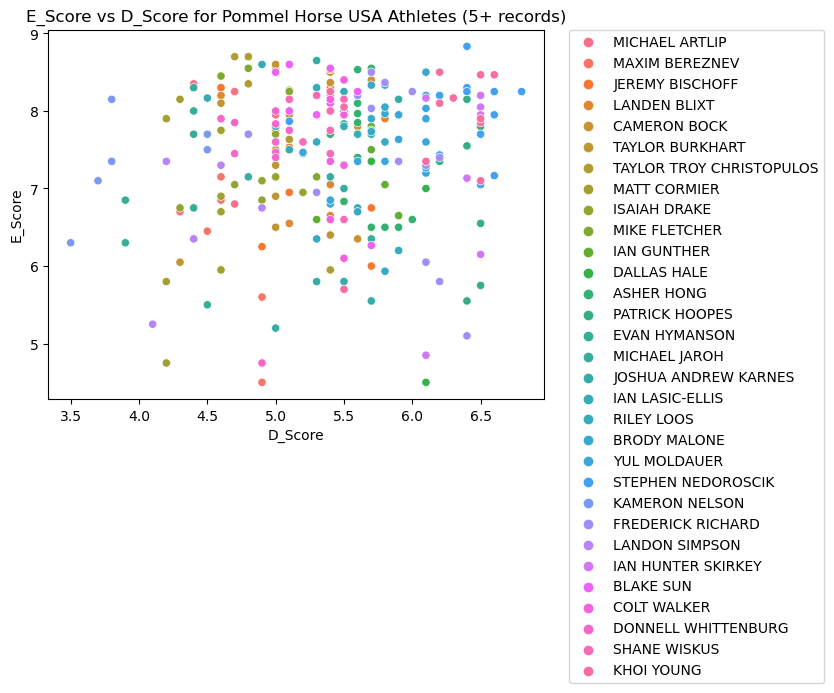

In [12]:
sns.scatterplot(data=ph_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Pommel Horse USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

In [13]:
ph_athletes_df = ph_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
ph_athletes_df['Mean_Score'] = ph_athletes_df['Mean_Score'].round(2)
ph_athletes_df['Mean_D_Score'] = ph_athletes_df['Mean_D_Score'].round(2)
ph_athletes_df['Mean_E_Score'] = ph_athletes_df['Mean_E_Score'].round(2)
ph_athletes_df = ph_athletes_df.sort_values('Mean_Score', ascending=False)
ph_athletes_df.index = range(1, len(ph_athletes_df) + 1)
ph_athletes_df.head(10)

,name,Mean_Score,Mean_D_Score,Mean_E_Score,Record_Count
1,STEPHEN NEDOROSCIK,14.30,6.36,7.94,12
2,KHOI YOUNG,13.97,6.15,7.82,12
3,BRODY MALONE,13.65,5.86,7.79,10
4,IAN HUNTER SKIRKEY,13.59,6.37,7.21,7
5,CAMERON BOCK,13.47,5.44,8.03,10
6,BLAKE SUN,13.38,5.33,8.05,9
7,YUL MOLDAUER,13.34,5.83,7.51,13
8,PATRICK HOOPES,13.33,6.41,6.96,7
9,IAN LASIC-ELLIS,13.27,5.24,8.02,7
10,FREDERICK RICHARD,13.14,5.83,7.31,13


### Score distribution of all competitors

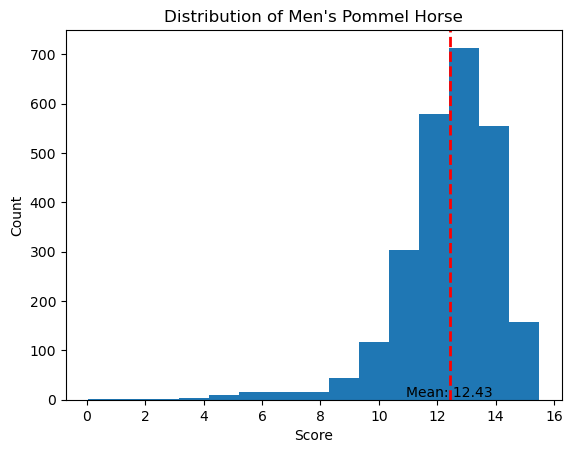

In [14]:
men_PH = men_data[men_data['Apparatus']=='PH']
men_PH_avg = men_PH['Score'].mean()
plt.hist(men_PH['Score'],bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Men's Pommel Horse")
plt.axvline(men_PH_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_PH_avg, 0, f'Mean: {men_PH_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

Text(0.5, 1.0, "Box Plot Distribution of Men's Pommel Horse")

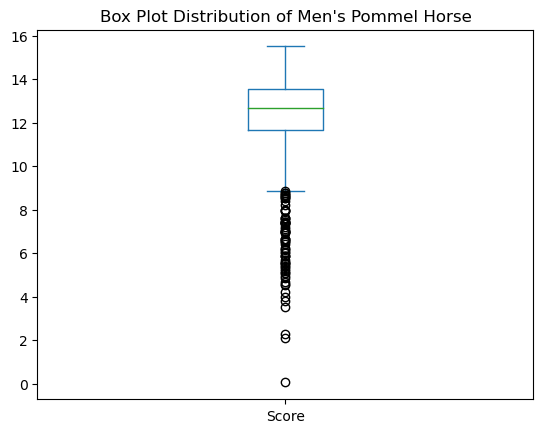

In [15]:
ax = men_PH['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Pommel Horse")

## Floor Exercise

### Competing frequency for FX, with 5+ records

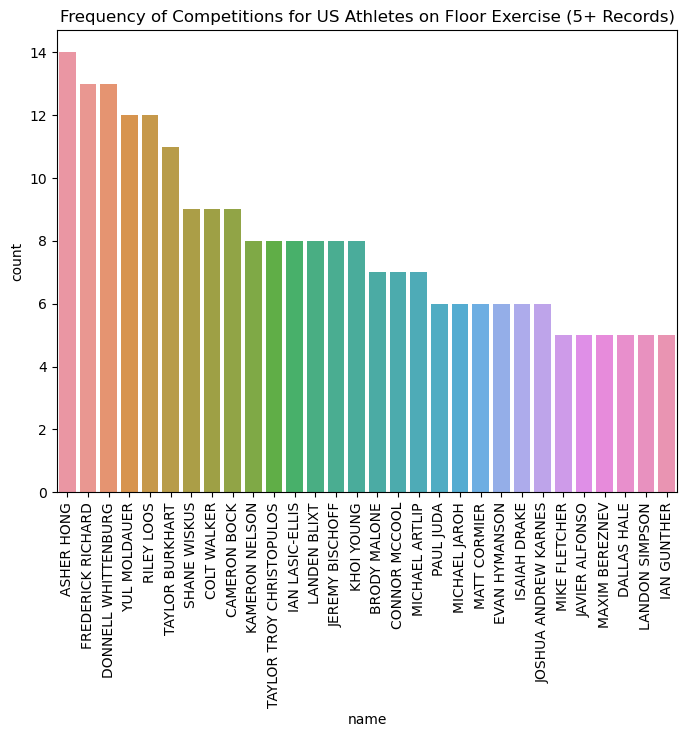

In [16]:
usa_fx_athletes = df[(df['Apparatus'] == 'FX') & (df['Country'] == 'USA')]
fx_athlete_competition_counts = usa_fx_athletes['name'].value_counts()
fx_frequent_competitors = fx_athlete_competition_counts[fx_athlete_competition_counts >= 5]
fx_frequent_competitors_data = usa_fx_athletes[usa_fx_athletes['name'].isin(fx_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
fx_competition_plot = sns.countplot(
    x='name', 
    data=fx_frequent_competitors_data, 
    order=fx_frequent_competitors.index
)
fx_competition_plot.set_xticklabels(fx_competition_plot.get_xticklabels(), rotation=90)
fx_competition_plot.set_title('Frequency of Competitions for US Athletes on Floor Exercise (5+ Records)')
plt.show()

### Competing frequency for FX, with 5+ records

Text(0.5, 1.0, 'E_Score vs D_Score for Floor Exercise USA Athletes (5+ records)')

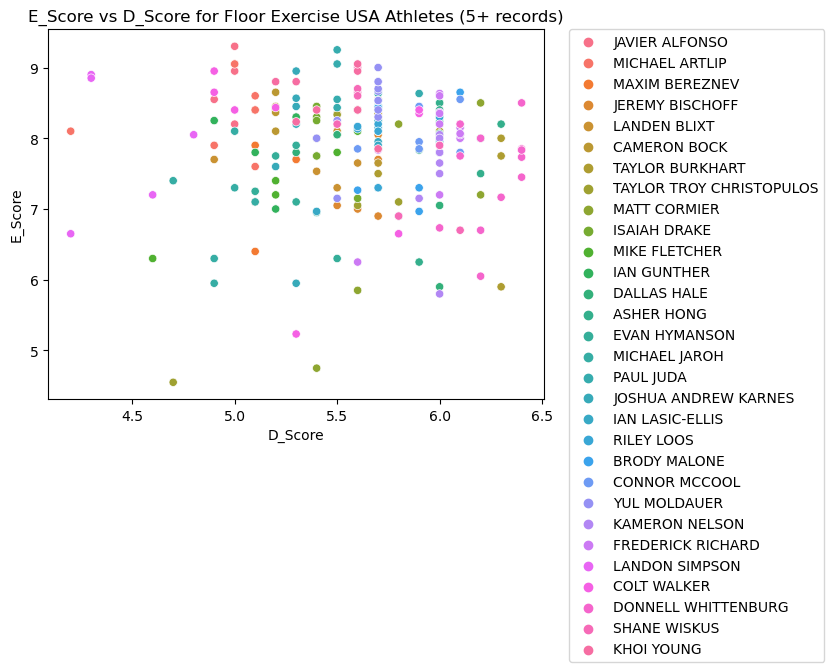

In [17]:
sns.scatterplot(data=fx_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Floor Exercise USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

In [18]:
fx_athletes_df = fx_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
fx_athletes_df['Mean_Score'] = fx_athletes_df['Mean_Score'].round(2)
fx_athletes_df['Mean_D_Score'] = fx_athletes_df['Mean_D_Score'].round(2)
fx_athletes_df['Mean_E_Score'] = fx_athletes_df['Mean_E_Score'].round(2)
fx_athletes_df = fx_athletes_df.sort_values('Mean_Score', ascending=False)
fx_athletes_df.index = range(1, len(fx_athletes_df) + 1)
fx_athletes_df.head(10)

,name,Mean_Score,Mean_D_Score,Mean_E_Score,Record_Count
1,PAUL JUDA,14.34,5.60,8.76,6
2,YUL MOLDAUER,14.07,5.64,8.43,12
3,KHOI YOUNG,14.02,5.46,8.56,8
4,CONNOR MCCOOL,14.01,5.94,8.07,7
5,FREDERICK RICHARD,13.92,5.98,7.99,13
6,ASHER HONG,13.91,6.04,8.00,14
7,TAYLOR BURKHART,13.85,6.05,7.80,11
8,JAVIER ALFONSO,13.79,4.98,8.81,5
9,SHANE WISKUS,13.75,5.71,8.12,9
10,BRODY MALONE,13.71,5.91,7.82,7


### Score distribution of all competitors

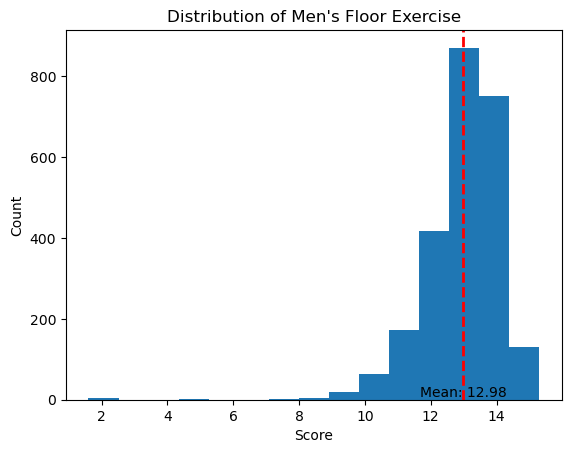

In [19]:
men_FX = men_data[men_data['Apparatus']=='FX']
men_FX_avg = men_FX['Score'].mean()
plt.hist(men_FX['Score'],bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Men's Floor Exercise")
plt.axvline(men_FX_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_FX_avg, 0, f'Mean: {men_FX_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

Text(0.5, 1.0, "Box Plot Distribution of Men's Floor Exercise")

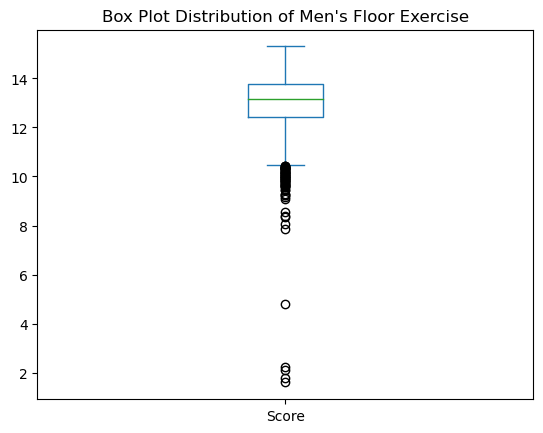

In [20]:
ax = men_FX['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Floor Exercise")

## Still Rings

### Competing frequency for SR, with 5+ records

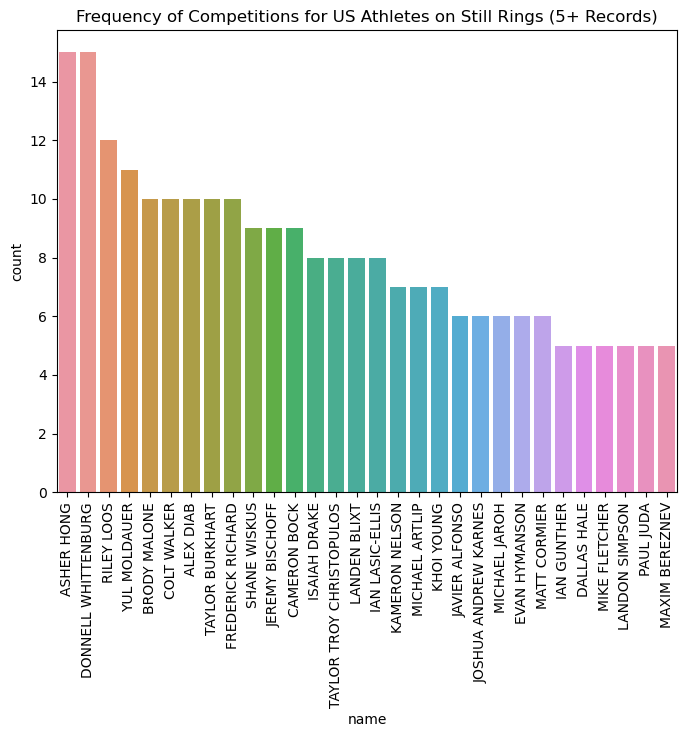

In [21]:
usa_sr_athletes = df[(df['Apparatus'] == 'SR') & (df['Country'] == 'USA')]
sr_athlete_competition_counts = usa_sr_athletes['name'].value_counts()
sr_frequent_competitors = sr_athlete_competition_counts[sr_athlete_competition_counts >= 5]
sr_frequent_competitors_data = usa_sr_athletes[usa_sr_athletes['name'].isin(sr_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
sr_competition_plot = sns.countplot(
    x='name', 
    data=sr_frequent_competitors_data, 
    order=sr_frequent_competitors.index
)
sr_competition_plot.set_xticklabels(sr_competition_plot.get_xticklabels(), rotation=90)
sr_competition_plot.set_title('Frequency of Competitions for US Athletes on Still Rings (5+ Records)')
plt.show()

### D_Score VS E_Score for SR Atheletes with 5+ Records

Text(0.5, 1.0, 'E_Score vs D_Score for Still Rings USA Athletes (5+ records)')

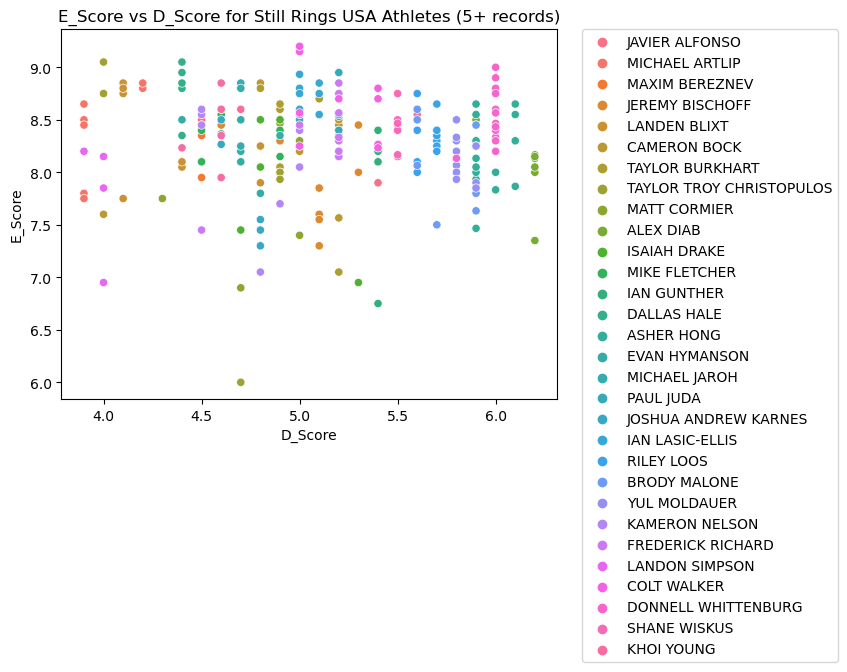

In [22]:
sns.scatterplot(data=sr_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Still Rings USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

In [23]:
sr_athletes_df = sr_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
sr_athletes_df['Mean_Score'] = sr_athletes_df['Mean_Score'].round(2)
sr_athletes_df['Mean_D_Score'] = sr_athletes_df['Mean_D_Score'].round(2)
sr_athletes_df['Mean_E_Score'] = sr_athletes_df['Mean_E_Score'].round(2)
sr_athletes_df = sr_athletes_df.sort_values('Mean_Score', ascending=False)
sr_athletes_df.index = range(1, len(sr_athletes_df) + 1)
sr_athletes_df.head(10)

,name,Mean_Score,Mean_D_Score,Mean_E_Score,Record_Count
1,DONNELL WHITTENBURG,14.54,5.99,8.55,15
2,ALEX DIAB,14.20,6.08,8.12,10
3,ASHER HONG,14.15,5.97,8.18,15
4,RILEY LOOS,14.02,5.67,8.35,12
5,YUL MOLDAUER,13.97,5.83,8.14,11
6,SHANE WISKUS,13.91,5.50,8.41,9
7,BRODY MALONE,13.87,5.75,8.11,10
8,COLT WALKER,13.84,5.22,8.67,10
9,JAVIER ALFONSO,13.79,5.38,8.41,6
10,PAUL JUDA,13.75,5.20,8.55,5


### Score distribution of all competitors

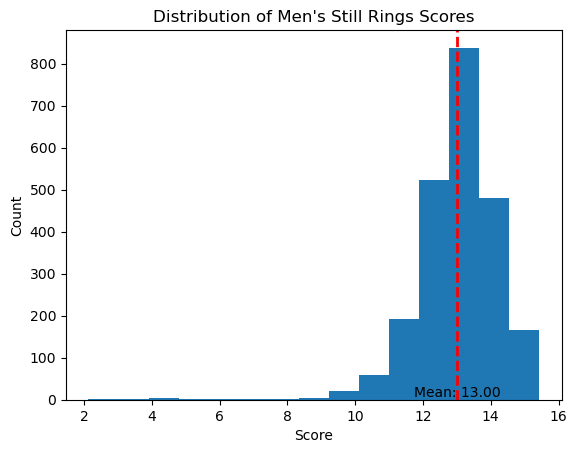

In [24]:
men_SR = men_data[men_data['Apparatus'] == 'SR']
men_SR_avg = men_SR['Score'].mean()
plt.hist(men_SR['Score'], bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Men's Still Rings Scores")
plt.axvline(men_SR_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_SR_avg, 0, f'Mean: {men_SR_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

Text(0.5, 1.0, "Box Plot Distribution of Men's Still Rings")

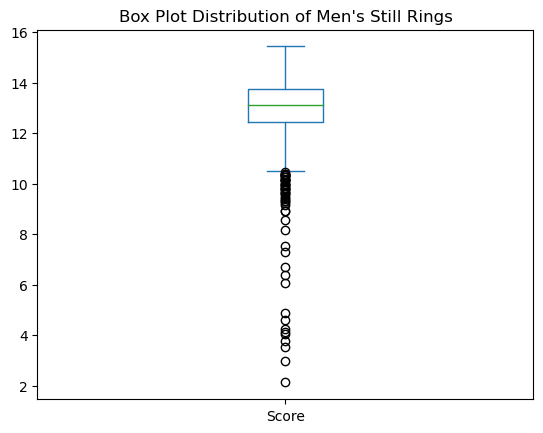

In [25]:
ax = men_SR['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Still Rings")

## Parallel Bars

### Competing frequency for SR, with 5+ records

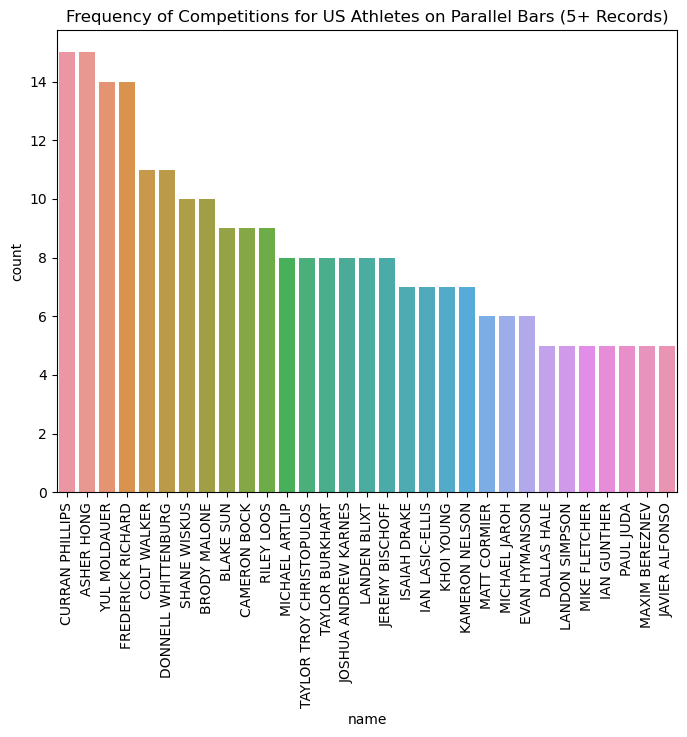

In [26]:
usa_pb_athletes = df[(df['Apparatus'] == 'PB') & (df['Country'] == 'USA')]
pb_athlete_competition_counts = usa_pb_athletes['name'].value_counts()
pb_frequent_competitors = pb_athlete_competition_counts[pb_athlete_competition_counts >= 5]
pb_frequent_competitors_data = usa_pb_athletes[usa_pb_athletes['name'].isin(pb_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
pb_competition_plot = sns.countplot(
    x='name', 
    data=pb_frequent_competitors_data, 
    order=pb_frequent_competitors.index
)
pb_competition_plot.set_xticklabels(pb_competition_plot.get_xticklabels(), rotation=90)
pb_competition_plot.set_title('Frequency of Competitions for US Athletes on Parallel Bars (5+ Records)')
plt.show()

### D_Score VS E_Score for PB Atheletes with 5+ Records

Text(0.5, 1.0, 'E_Score vs D_Score for Parallel Bars USA Athletes (5+ records)')

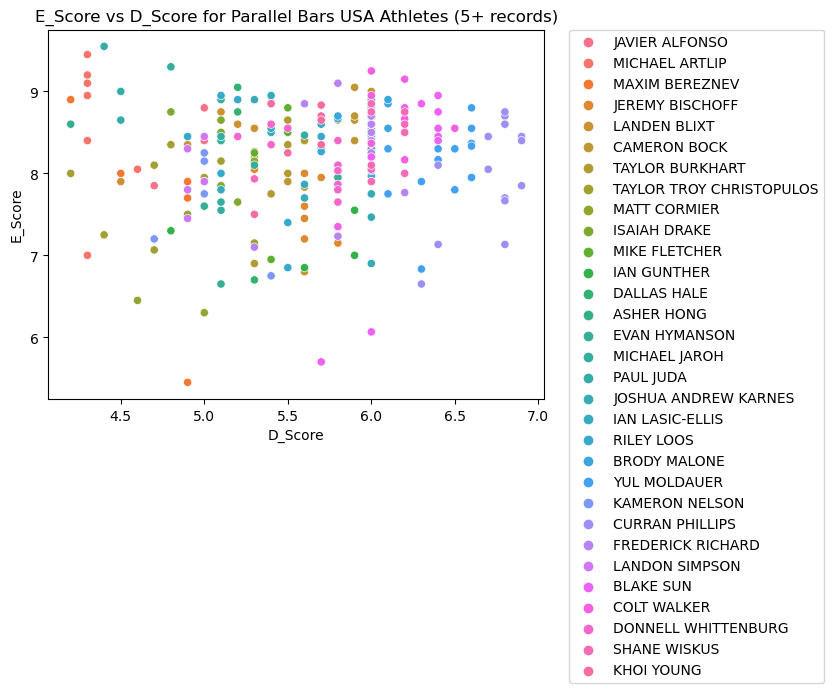

In [27]:
sns.scatterplot(data=pb_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Parallel Bars USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

In [28]:
pb_athletes_df = pb_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
pb_athletes_df['Mean_Score'] = pb_athletes_df['Mean_Score'].round(2)
pb_athletes_df['Mean_D_Score'] = pb_athletes_df['Mean_D_Score'].round(2)
pb_athletes_df['Mean_E_Score'] = pb_athletes_df['Mean_E_Score'].round(2)
pb_athletes_df = pb_athletes_df.sort_values('Mean_Score', ascending=False)
pb_athletes_df.index = range(1, len(pb_athletes_df) + 1)
pb_athletes_df.head(10)

,name,Mean_Score,Mean_D_Score,Mean_E_Score,Record_Count
1,CURRAN PHILLIPS,14.74,6.72,8.02,15
2,COLT WALKER,14.67,6.12,8.56,11
3,ASHER HONG,14.61,6.00,8.61,15
4,YUL MOLDAUER,14.54,6.44,8.09,14
5,BRODY MALONE,14.50,5.96,8.54,10
6,SHANE WISKUS,14.35,6.01,8.34,10
7,BLAKE SUN,14.21,6.22,7.99,9
8,FREDERICK RICHARD,14.17,5.91,8.26,14
9,KHOI YOUNG,14.02,5.57,8.45,7
10,CAMERON BOCK,13.99,5.77,8.23,9


### Score distribution of all competitors

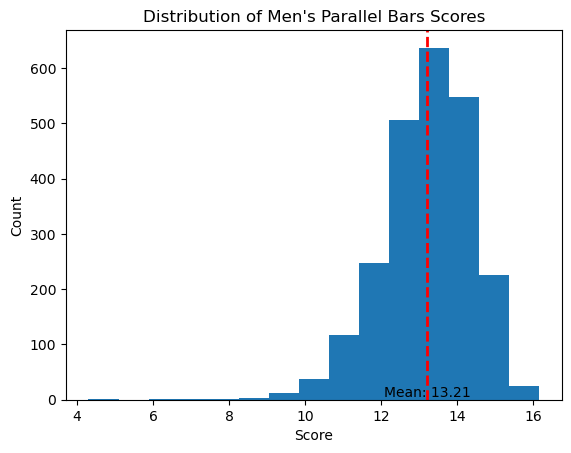

In [29]:
men_PB = men_data[men_data['Apparatus'] == 'PB']
men_PB_avg = men_PB['Score'].mean()
plt.hist(men_PB['Score'], bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Men's Parallel Bars Scores")
plt.axvline(men_PB_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_PB_avg, 0, f'Mean: {men_PB_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

Text(0.5, 1.0, "Box Plot Distribution of Men's Still Rings")

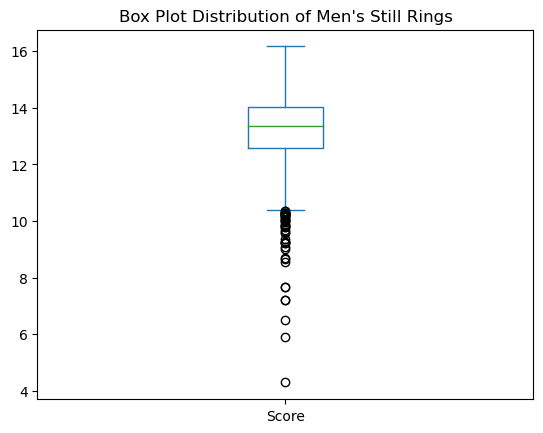

In [30]:
ax = men_PB['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Still Rings")

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn as sns

# for the convennience of our analysis, we only changed the improting code and selected data but not the name
men_data=pd.read_csv('women_raw_1_14_2.csv')
df=men_data.copy()
men_data

df=men_data.copy()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn as sns

men_data=pd.read_csv('men_raw_1_14_2.csv')
df=men_data.copy()

df=men_data.copy()

## General Score Analysis

### Distribution of average scores of athletes over the world

# Select the best performing atheletes in the world
scores = df.loc[:,['name','Country','Score','D_Score','E_Score']].groupby(['name','Country']).mean().sort_values('Score',ascending=False) # Mean scores of atheletes
scores.head()
scores.reset_index(inplace=True)
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Plot the scores
fig = px.scatter(scores, x='D_Score', y='E_Score',hover_name='name',color='Country')
fig.update_layout(title='Average Scores of Athletes')
fig.show()

### Distribution of average scores of athletes over the world

fig = make_subplots(rows=1, cols=3)
# Histogram for the first column
fig.add_trace(
    go.Histogram(x=scores['Score'], nbinsx=20, name='Score'),
    row=1, col=1
)

# Histogram for the second column
fig.add_trace(
    go.Histogram(x=scores['D_Score'], nbinsx=20, name='D_Score'),
    row=1, col=2
)
fig.add_trace(
    go.Histogram(x=scores['E_Score'], nbinsx=20, name='E_Score'),
    row=1, col=3
)
fig.update_layout(title_text="Distribution of Score, D_Score, and E_Score for men")
fig.update_xaxes(title_text="Score", row=1, col=1)
fig.update_xaxes(title_text="D_Score", row=1, col=2)
fig.update_xaxes(title_text="E_Score", row=1, col=3)
fig.update_yaxes(title_text="Count", row=1, col=1)
fig.show()

## Horizontal Bar

### Competing frequency for HB, with 5+ records

usa_hb_athletes = df[(df['Apparatus'] == 'HB') & (df['Country'] == 'USA')]
hb_athlete_competition_counts = usa_hb_athletes['name'].value_counts()
hb_frequent_competitors = hb_athlete_competition_counts[hb_athlete_competition_counts >= 5]
hb_frequent_competitors_data = usa_hb_athletes[usa_hb_athletes['name'].isin(hb_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
hb_competition_plot = sns.countplot(
    x='name', 
    data=hb_frequent_competitors_data, 
    order=hb_frequent_competitors.index
)
hb_competition_plot.set_xticklabels(hb_competition_plot.get_xticklabels(), rotation=90)
hb_competition_plot.set_title('Frequency of Competitions for US Athletes on Horizontal Bar (5+ Records)')
plt.show()

### D_Score VS E_Score for HB Atheletes with 5+ Records

sns.scatterplot(data=hb_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Horizontal Bar USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

hb_athletes_df = hb_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
hb_athletes_df['Mean_Score'] = hb_athletes_df['Mean_Score'].round(2)
hb_athletes_df['Mean_D_Score'] = hb_athletes_df['Mean_D_Score'].round(2)
hb_athletes_df['Mean_E_Score'] = hb_athletes_df['Mean_E_Score'].round(2)
hb_athletes_df = hb_athletes_df.sort_values('Mean_Score', ascending=False)
hb_athletes_df.index = range(1, len(hb_athletes_df) + 1)
hb_athletes_df.head(10)

### Score distribution of all competitors

men_HB = men_data[men_data['Apparatus']=='HB']
men_HB_avg = men_HB['Score'].mean()
plt.hist(men_HB['Score'],bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Men's Horizontal Bars")
plt.axvline(men_HB_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_HB_avg, 0, f'Mean: {men_HB_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

### Score distribution of all competitors

ax = men_HB['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Horizontal Bars")

## Pommel Horse

### Competing frequency for PH, with 5+ records

usa_ph_athletes = df[(df['Apparatus'] == 'PH') & (df['Country'] == 'USA')]
ph_athlete_competition_counts = usa_ph_athletes['name'].value_counts()
ph_frequent_competitors = ph_athlete_competition_counts[ph_athlete_competition_counts >= 5]
ph_frequent_competitors_data = usa_ph_athletes[usa_ph_athletes['name'].isin(ph_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
ph_competition_plot = sns.countplot(
    x='name', 
    data=ph_frequent_competitors_data, 
    order=ph_frequent_competitors.index
)
ph_competition_plot.set_xticklabels(ph_competition_plot.get_xticklabels(), rotation=90)
ph_competition_plot.set_title('Frequency of Competitions for US Athletes on Pommel Horse (5+ Records)')
plt.show()

### D_Score VS E_Score for PH Atheletes with 5+ Records

sns.scatterplot(data=ph_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Pommel Horse USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

ph_athletes_df = ph_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
ph_athletes_df['Mean_Score'] = ph_athletes_df['Mean_Score'].round(2)
ph_athletes_df['Mean_D_Score'] = ph_athletes_df['Mean_D_Score'].round(2)
ph_athletes_df['Mean_E_Score'] = ph_athletes_df['Mean_E_Score'].round(2)
ph_athletes_df = ph_athletes_df.sort_values('Mean_Score', ascending=False)
ph_athletes_df.index = range(1, len(ph_athletes_df) + 1)
ph_athletes_df.head(10)

### Score distribution of all competitors

men_PH = men_data[men_data['Apparatus']=='PH']
men_PH_avg = men_PH['Score'].mean()
plt.hist(men_PH['Score'],bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Men's Pommel Horse")
plt.axvline(men_PH_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_PH_avg, 0, f'Mean: {men_PH_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

ax = men_PH['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Pommel Horse")

## Floor Exercise

### Competing frequency for FX, with 5+ records

usa_fx_athletes = df[(df['Apparatus'] == 'FX') & (df['Country'] == 'USA')]
fx_athlete_competition_counts = usa_fx_athletes['name'].value_counts()
fx_frequent_competitors = fx_athlete_competition_counts[fx_athlete_competition_counts >= 5]
fx_frequent_competitors_data = usa_fx_athletes[usa_fx_athletes['name'].isin(fx_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
fx_competition_plot = sns.countplot(
    x='name', 
    data=fx_frequent_competitors_data, 
    order=fx_frequent_competitors.index
)
fx_competition_plot.set_xticklabels(fx_competition_plot.get_xticklabels(), rotation=90)
fx_competition_plot.set_title('Frequency of Competitions for US Athletes on Floor Exercise (5+ Records)')
plt.show()

### Competing frequency for FX, with 5+ records

sns.scatterplot(data=fx_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Floor Exercise USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

fx_athletes_df = fx_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
fx_athletes_df['Mean_Score'] = fx_athletes_df['Mean_Score'].round(2)
fx_athletes_df['Mean_D_Score'] = fx_athletes_df['Mean_D_Score'].round(2)
fx_athletes_df['Mean_E_Score'] = fx_athletes_df['Mean_E_Score'].round(2)
fx_athletes_df = fx_athletes_df.sort_values('Mean_Score', ascending=False)
fx_athletes_df.index = range(1, len(fx_athletes_df) + 1)
fx_athletes_df.head(10)

### Score distribution of all competitors

men_FX = men_data[men_data['Apparatus']=='FX']
men_FX_avg = men_FX['Score'].mean()
plt.hist(men_FX['Score'],bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Men's Floor Exercise")
plt.axvline(men_FX_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_FX_avg, 0, f'Mean: {men_FX_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

ax = men_FX['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Floor Exercise")

## Still Rings

### Competing frequency for SR, with 5+ records

usa_sr_athletes = df[(df['Apparatus'] == 'SR') & (df['Country'] == 'USA')]
sr_athlete_competition_counts = usa_sr_athletes['name'].value_counts()
sr_frequent_competitors = sr_athlete_competition_counts[sr_athlete_competition_counts >= 5]
sr_frequent_competitors_data = usa_sr_athletes[usa_sr_athletes['name'].isin(sr_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
sr_competition_plot = sns.countplot(
    x='name', 
    data=sr_frequent_competitors_data, 
    order=sr_frequent_competitors.index
)
sr_competition_plot.set_xticklabels(sr_competition_plot.get_xticklabels(), rotation=90)
sr_competition_plot.set_title('Frequency of Competitions for US Athletes on Still Rings (5+ Records)')
plt.show()

### D_Score VS E_Score for SR Atheletes with 5+ Records

sns.scatterplot(data=sr_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Still Rings USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

sr_athletes_df = sr_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
sr_athletes_df['Mean_Score'] = sr_athletes_df['Mean_Score'].round(2)
sr_athletes_df['Mean_D_Score'] = sr_athletes_df['Mean_D_Score'].round(2)
sr_athletes_df['Mean_E_Score'] = sr_athletes_df['Mean_E_Score'].round(2)
sr_athletes_df = sr_athletes_df.sort_values('Mean_Score', ascending=False)
sr_athletes_df.index = range(1, len(sr_athletes_df) + 1)
sr_athletes_df.head(10)

### Score distribution of all competitors

men_SR = men_data[men_data['Apparatus'] == 'SR']
men_SR_avg = men_SR['Score'].mean()
plt.hist(men_SR['Score'], bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Men's Still Rings Scores")
plt.axvline(men_SR_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_SR_avg, 0, f'Mean: {men_SR_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

ax = men_SR['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Still Rings")

## Parallel Bars

### Competing frequency for SR, with 5+ records

usa_pb_athletes = df[(df['Apparatus'] == 'PB') & (df['Country'] == 'USA')]
pb_athlete_competition_counts = usa_pb_athletes['name'].value_counts()
pb_frequent_competitors = pb_athlete_competition_counts[pb_athlete_competition_counts >= 5]
pb_frequent_competitors_data = usa_pb_athletes[usa_pb_athletes['name'].isin(pb_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
pb_competition_plot = sns.countplot(
    x='name', 
    data=pb_frequent_competitors_data, 
    order=pb_frequent_competitors.index
)
pb_competition_plot.set_xticklabels(pb_competition_plot.get_xticklabels(), rotation=90)
pb_competition_plot.set_title('Frequency of Competitions for US Athletes on Parallel Bars (5+ Records)')
plt.show()

### D_Score VS E_Score for PB Atheletes with 5+ Records

sns.scatterplot(data=pb_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Parallel Bars USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

pb_athletes_df = pb_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
pb_athletes_df['Mean_Score'] = pb_athletes_df['Mean_Score'].round(2)
pb_athletes_df['Mean_D_Score'] = pb_athletes_df['Mean_D_Score'].round(2)
pb_athletes_df['Mean_E_Score'] = pb_athletes_df['Mean_E_Score'].round(2)
pb_athletes_df = pb_athletes_df.sort_values('Mean_Score', ascending=False)
pb_athletes_df.index = range(1, len(pb_athletes_df) + 1)
pb_athletes_df.head(10)

### Score distribution of all competitors

men_PB = men_data[men_data['Apparatus'] == 'PB']
men_PB_avg = men_PB['Score'].mean()
plt.hist(men_PB['Score'], bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Men's Parallel Bars Scores")
plt.axvline(men_PB_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_PB_avg, 0, f'Mean: {men_PB_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

ax = men_PB['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Still Rings")

## General Score Analysis

### Distribution of average scores of athletes over the world

In [51]:
# Select the best performing atheletes in the world
scores = df.loc[:,['name','Country','Score','D_Score','E_Score']].groupby(['name','Country']).mean().sort_values('Score',ascending=False) # Mean scores of atheletes
scores.head()
scores.reset_index(inplace=True)
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

# Plot the scores
fig = px.scatter(scores, x='D_Score', y='E_Score',hover_name='name',color='Country')
fig.update_layout(title='Average Scores of Athletes')

X = scores['D_Score'].values.reshape(-1, 1)
y = scores['E_Score'].values
model = LinearRegression().fit(X, y)

# Predictions for the line
x_range = np.linspace(X.min(), X.max(), 100)
y_pred = model.predict(x_range.reshape(-1, 1))

# Add regression line to plot
fig.add_trace(go.Scatter(x=x_range, y=y_pred, name='Regression Line', mode='lines'))
fig.show()
d_score = df['D_Score']
e_score = df['E_Score']
df[['D_Score', 'E_Score']].corr()
scores.head()


X = scores['D_Score'].values.reshape(-1, 1)
y = scores['E_Score'].values
model = LinearRegression().fit(X, y)
print(model.intercept_, model.coef_, model.score(X, y))
est = sm.OLS(y, X)
est2 = est.fit()
print(est2.summary())

5.359381335336458 [0.44943034] 0.1646560590519971
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.982
Model:                            OLS   Adj. R-squared (uncentered):              0.982
Method:                 Least Squares   F-statistic:                          4.220e+04
Date:                Mon, 15 Jan 2024   Prob (F-statistic):                        0.00
Time:                        18:47:25   Log-Likelihood:                         -1114.5
No. Observations:                 787   AIC:                                      2231.
Df Residuals:                     786   BIC:                                      2236.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025    

### Distribution of average scores of athletes over the world

In [52]:
fig = make_subplots(rows=1, cols=3)
# Histogram for the first column
fig.add_trace(
    go.Histogram(x=scores['Score'], nbinsx=20, name='Score'),
    row=1, col=1
)

# Histogram for the second column
fig.add_trace(
    go.Histogram(x=scores['D_Score'], nbinsx=20, name='D_Score'),
    row=1, col=2
)
fig.add_trace(
    go.Histogram(x=scores['E_Score'], nbinsx=20, name='E_Score'),
    row=1, col=3
)
fig.update_layout(title_text="Distribution of Score, D_Score, and E_Score for men")
fig.update_xaxes(title_text="Score", row=1, col=1)
fig.update_xaxes(title_text="D_Score", row=1, col=2)
fig.update_xaxes(title_text="E_Score", row=1, col=3)
fig.update_yaxes(title_text="Count", row=1, col=1)
fig.show()

## Uneven Bars

### Competing frequency for UB, with 5+ records

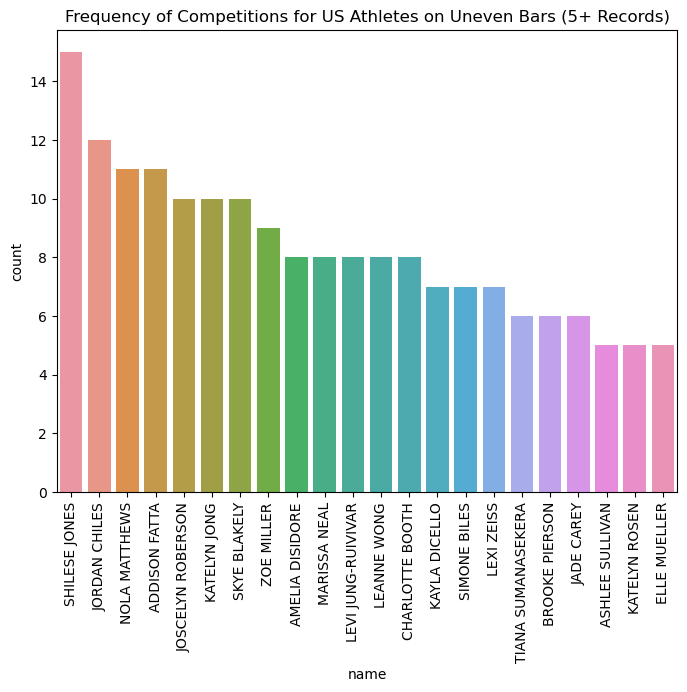

In [53]:
usa_hb_athletes = df[(df['Apparatus'] == 'UB') & (df['Country'] == 'USA')]
hb_athlete_competition_counts = usa_hb_athletes['name'].value_counts()
hb_frequent_competitors = hb_athlete_competition_counts[hb_athlete_competition_counts >= 5]
hb_frequent_competitors_data = usa_hb_athletes[usa_hb_athletes['name'].isin(hb_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
hb_competition_plot = sns.countplot(
    x='name', 
    data=hb_frequent_competitors_data, 
    order=hb_frequent_competitors.index
)
hb_competition_plot.set_xticklabels(hb_competition_plot.get_xticklabels(), rotation=90)
hb_competition_plot.set_title('Frequency of Competitions for US Athletes on Uneven Bars (5+ Records)')
plt.show()

### D_Score VS E_Score for HB Atheletes with 5+ Records

Text(0.5, 1.0, 'E_Score vs D_Score for Uneven Bars USA Athletes (5+ records)')

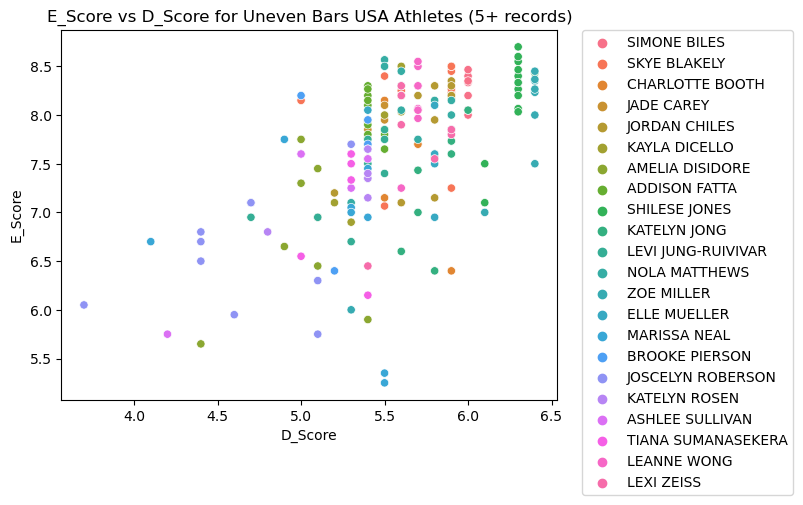

In [54]:
sns.scatterplot(data=hb_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Uneven Bars USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

In [55]:
hb_athletes_df = hb_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
hb_athletes_df['Mean_Score'] = hb_athletes_df['Mean_Score'].round(2)
hb_athletes_df['Mean_D_Score'] = hb_athletes_df['Mean_D_Score'].round(2)
hb_athletes_df['Mean_E_Score'] = hb_athletes_df['Mean_E_Score'].round(2)
hb_athletes_df = hb_athletes_df.sort_values('Mean_Score', ascending=False)
hb_athletes_df.index = range(1, len(hb_athletes_df) + 1)
hb_athletes_df.head(10)

,name,Mean_Score,Mean_D_Score,Mean_E_Score,Record_Count
1,SHILESE JONES,14.51,6.29,8.22,15
2,SIMONE BILES,14.26,6.00,8.26,7
3,ZOE MILLER,14.01,6.24,7.80,9
4,LEANNE WONG,13.81,5.69,8.12,8
5,SKYE BLAKELY,13.81,5.70,8.11,10
6,NOLA MATTHEWS,13.74,5.66,8.08,11
7,JORDAN CHILES,13.66,5.77,7.89,12
8,LEXI ZEISS,13.41,5.69,7.72,7
9,ADDISON FATTA,13.39,5.43,7.96,11
10,ELLE MUELLER,13.36,5.72,7.64,5


In [56]:
### Score distribution of all competitors

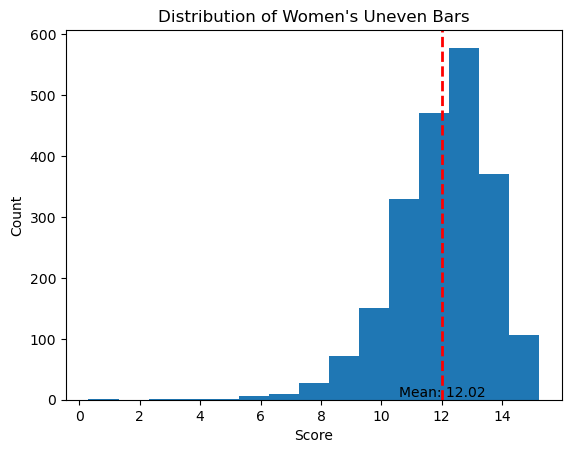

In [57]:
men_HB = men_data[men_data['Apparatus']=='UB']
men_HB_avg = men_HB['Score'].mean()
plt.hist(men_HB['Score'],bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Women's Uneven Bars")
plt.axvline(men_HB_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_HB_avg, 0, f'Mean: {men_HB_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

### Score distribution of all competitors

Text(0.5, 1.0, "Box Plot Distribution of Women's Uneven Bars")

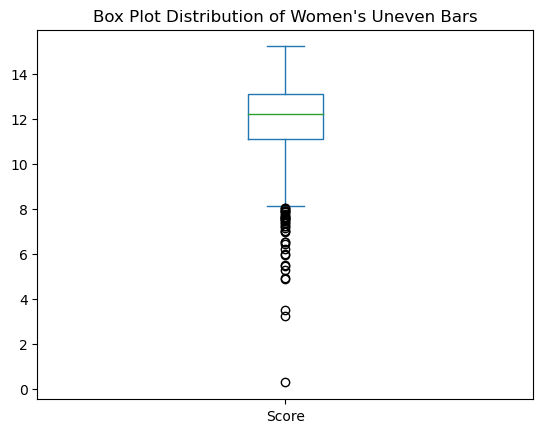

In [58]:
ax = men_HB['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Women's Uneven Bars")

## Balance Beam

### Competing frequency for BB, with 5+ records

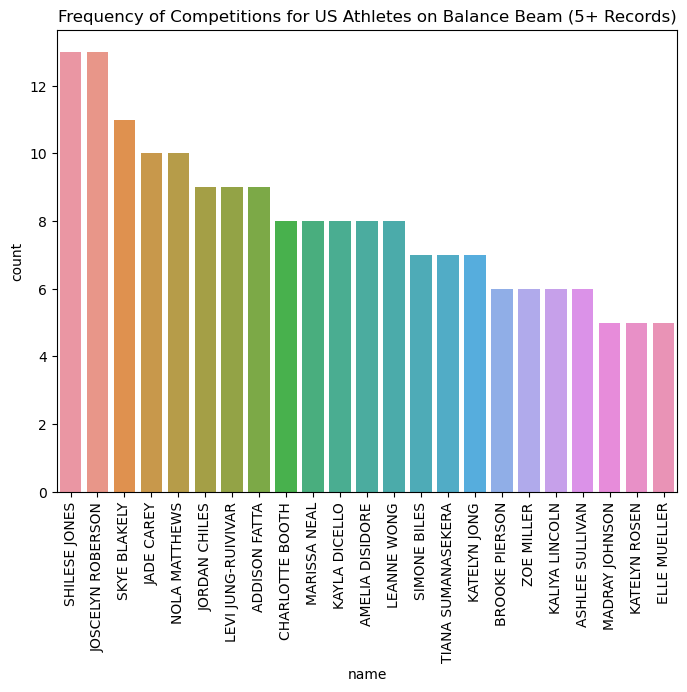

In [59]:
usa_ph_athletes = df[(df['Apparatus'] == 'BB') & (df['Country'] == 'USA')]
ph_athlete_competition_counts = usa_ph_athletes['name'].value_counts()
ph_frequent_competitors = ph_athlete_competition_counts[ph_athlete_competition_counts >= 5]
ph_frequent_competitors_data = usa_ph_athletes[usa_ph_athletes['name'].isin(ph_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
ph_competition_plot = sns.countplot(
    x='name', 
    data=ph_frequent_competitors_data, 
    order=ph_frequent_competitors.index
)
ph_competition_plot.set_xticklabels(ph_competition_plot.get_xticklabels(), rotation=90)
ph_competition_plot.set_title('Frequency of Competitions for US Athletes on Balance Beam (5+ Records)')
plt.show()

### D_Score VS E_Score for PH Atheletes with 5+ Records

Text(0.5, 1.0, 'E_Score vs D_Score for Balance Beam USA Athletes (5+ records)')

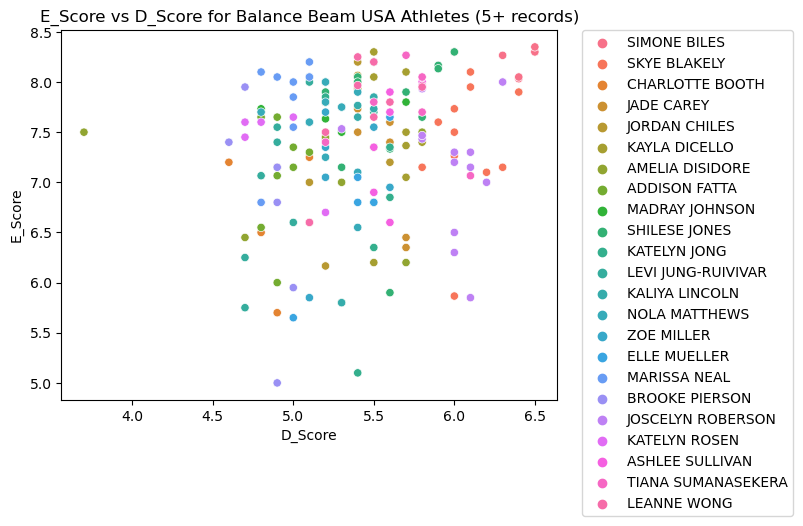

In [60]:
sns.scatterplot(data=ph_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Balance Beam USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

In [61]:
ph_athletes_df = ph_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
ph_athletes_df['Mean_Score'] = ph_athletes_df['Mean_Score'].round(2)
ph_athletes_df['Mean_D_Score'] = ph_athletes_df['Mean_D_Score'].round(2)
ph_athletes_df['Mean_E_Score'] = ph_athletes_df['Mean_E_Score'].round(2)
ph_athletes_df = ph_athletes_df.sort_values('Mean_Score', ascending=False)
ph_athletes_df.index = range(1, len(ph_athletes_df) + 1)
ph_athletes_df.head(10)

,name,Mean_Score,Mean_D_Score,Mean_E_Score,Record_Count
1,SIMONE BILES,14.60,6.37,8.23,7
2,SKYE BLAKELY,13.46,6.07,7.39,11
3,TIANA SUMANASEKERA,13.44,5.70,7.75,7
4,SHILESE JONES,13.32,5.58,7.74,13
5,LEANNE WONG,13.16,5.44,7.74,8
6,KAYLA DICELLO,13.13,5.64,7.50,8
7,JOSCELYN ROBERSON,13.11,5.96,7.15,13
8,ASHLEE SULLIVAN,12.99,5.60,7.41,6
9,JADE CAREY,12.94,5.56,7.39,10
10,JORDAN CHILES,12.90,5.32,7.58,9


### Score distribution of all competitors

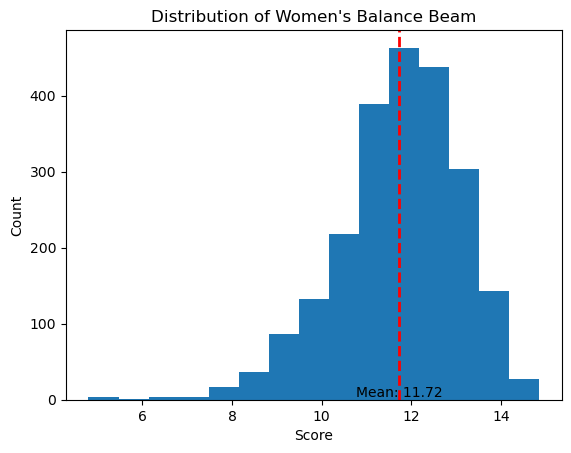

Text(0.5, 1.0, "Box Plot Distribution of Women's Balance Beam")

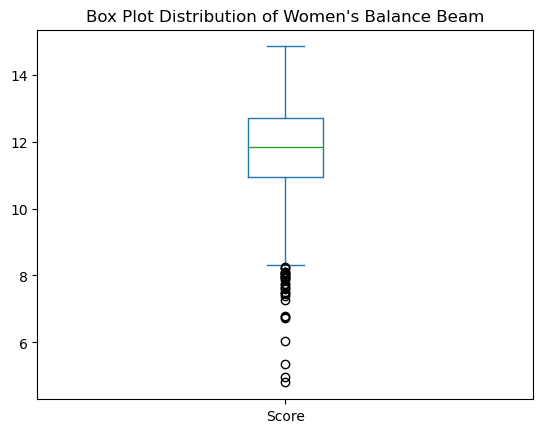

In [62]:
men_PH = men_data[men_data['Apparatus']=='BB']
men_PH_avg = men_PH['Score'].mean()
plt.hist(men_PH['Score'],bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Women's Balance Beam")
plt.axvline(men_PH_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_PH_avg, 0, f'Mean: {men_PH_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

ax = men_PH['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Women's Balance Beam")

## Floor Exercise

### Competing frequency for FX, with 5+ records

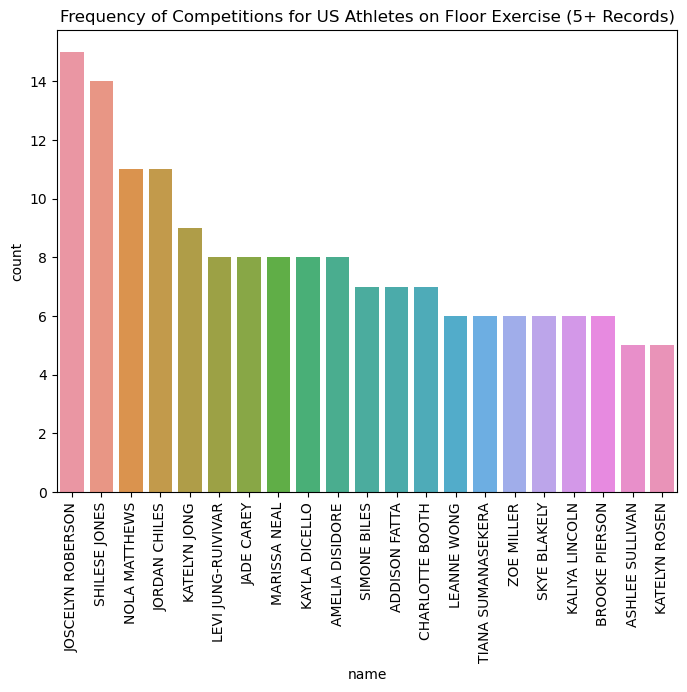

In [63]:
usa_fx_athletes = df[(df['Apparatus'] == 'FX') & (df['Country'] == 'USA')]
fx_athlete_competition_counts = usa_fx_athletes['name'].value_counts()
fx_frequent_competitors = fx_athlete_competition_counts[fx_athlete_competition_counts >= 5]
fx_frequent_competitors_data = usa_fx_athletes[usa_fx_athletes['name'].isin(fx_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
fx_competition_plot = sns.countplot(
    x='name', 
    data=fx_frequent_competitors_data, 
    order=fx_frequent_competitors.index
)
fx_competition_plot.set_xticklabels(fx_competition_plot.get_xticklabels(), rotation=90)
fx_competition_plot.set_title('Frequency of Competitions for US Athletes on Floor Exercise (5+ Records)')
plt.show()

### Competing frequency for FX, with 5+ records

Text(0.5, 1.0, 'E_Score vs D_Score for Floor Exercise USA Athletes (5+ records)')

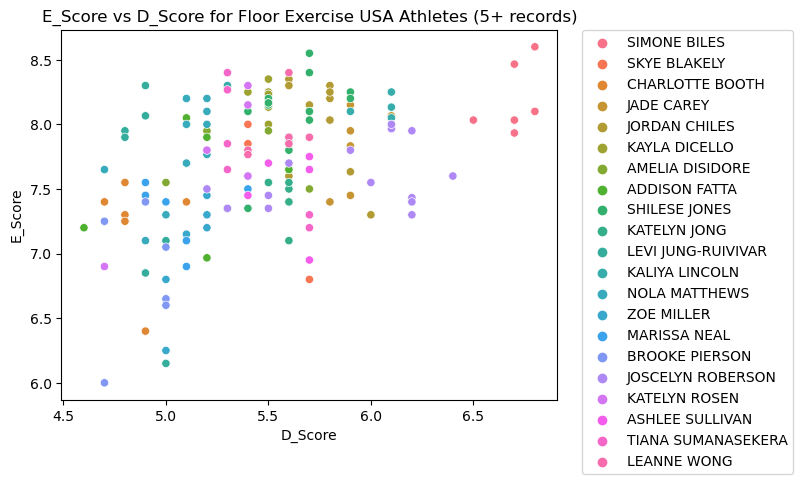

In [64]:
sns.scatterplot(data=fx_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Floor Exercise USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

In [65]:
fx_athletes_df = fx_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
fx_athletes_df['Mean_Score'] = fx_athletes_df['Mean_Score'].round(2)
fx_athletes_df['Mean_D_Score'] = fx_athletes_df['Mean_D_Score'].round(2)
fx_athletes_df['Mean_E_Score'] = fx_athletes_df['Mean_E_Score'].round(2)
fx_athletes_df = fx_athletes_df.sort_values('Mean_Score', ascending=False)
fx_athletes_df.index = range(1, len(fx_athletes_df) + 1)
fx_athletes_df.head(10)

,name,Mean_Score,Mean_D_Score,Mean_E_Score,Record_Count
1,SIMONE BILES,14.87,6.71,8.18,7
2,KALIYA LINCOLN,14.01,5.93,8.14,6
3,JADE CAREY,13.80,5.96,7.85,8
4,JORDAN CHILES,13.73,5.75,8.00,11
5,SHILESE JONES,13.70,5.62,8.11,14
6,KAYLA DICELLO,13.62,5.45,8.17,8
7,JOSCELYN ROBERSON,13.51,5.90,7.62,15
8,LEANNE WONG,13.47,5.55,7.94,6
9,TIANA SUMANASEKERA,13.21,5.43,7.78,6
10,KATELYN JONG,13.17,5.58,7.59,9


### Score distribution of all competitors

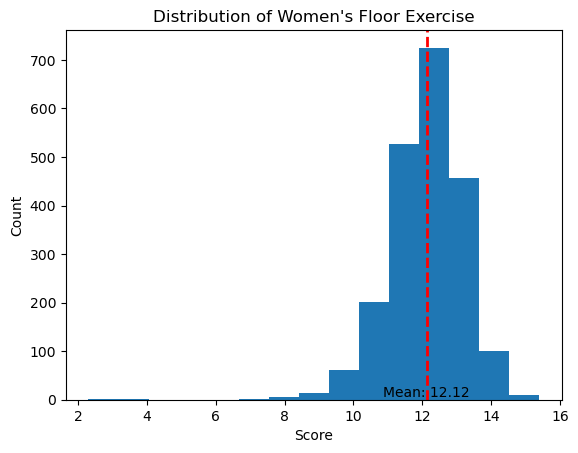

Text(0.5, 1.0, "Box Plot Distribution of Men's Floor Exercise")

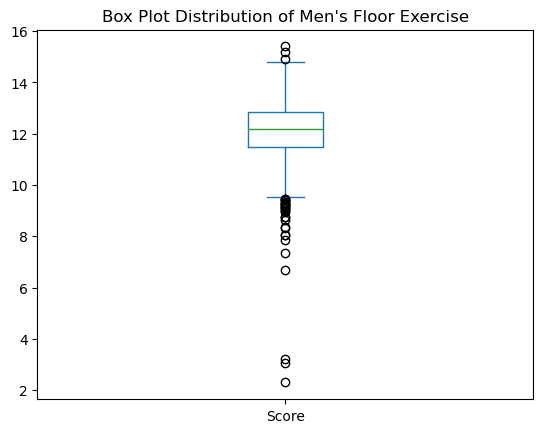

In [66]:
men_FX = men_data[men_data['Apparatus']=='FX']
men_FX_avg = men_FX['Score'].mean()
plt.hist(men_FX['Score'],bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Women's Floor Exercise")
plt.axvline(men_FX_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_FX_avg, 0, f'Mean: {men_FX_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

ax = men_FX['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Floor Exercise")

## Vault

### Competing frequency for VT, with 5+ records

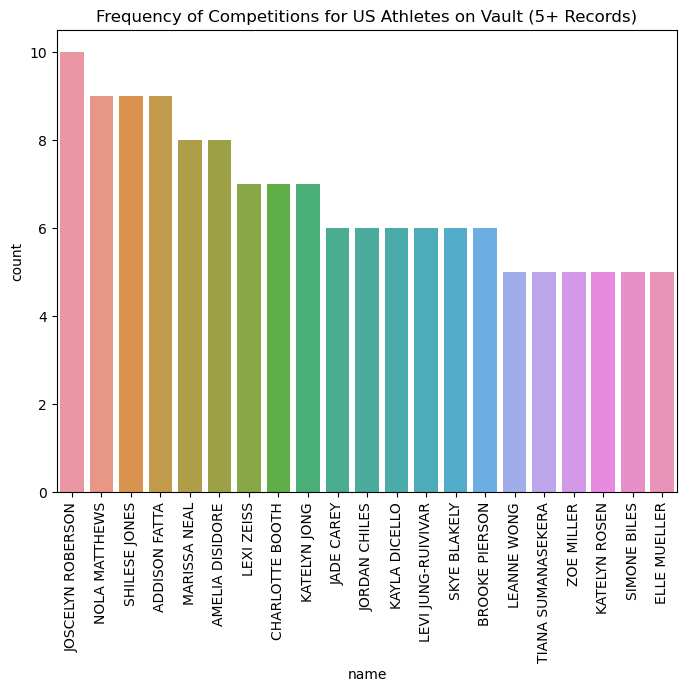

In [67]:
usa_sr_athletes = df[(df['Apparatus'] == 'VT') & (df['Country'] == 'USA')]
sr_athlete_competition_counts = usa_sr_athletes['name'].value_counts()
sr_frequent_competitors = sr_athlete_competition_counts[sr_athlete_competition_counts >= 5]
sr_frequent_competitors_data = usa_sr_athletes[usa_sr_athletes['name'].isin(sr_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
sr_competition_plot = sns.countplot(
    x='name', 
    data=sr_frequent_competitors_data, 
    order=sr_frequent_competitors.index
)
sr_competition_plot.set_xticklabels(sr_competition_plot.get_xticklabels(), rotation=90)
sr_competition_plot.set_title('Frequency of Competitions for US Athletes on Vault (5+ Records)')
plt.show()

### D_Score VS E_Score for VT Atheletes with 5+ Records

Text(0.5, 1.0, 'E_Score vs D_Score for Vault USA Athletes (5+ records)')

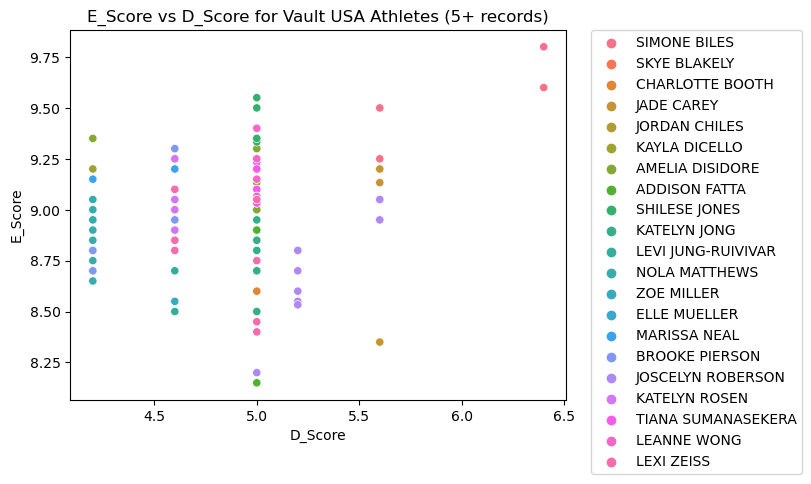

In [68]:
sns.scatterplot(data=sr_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Vault USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

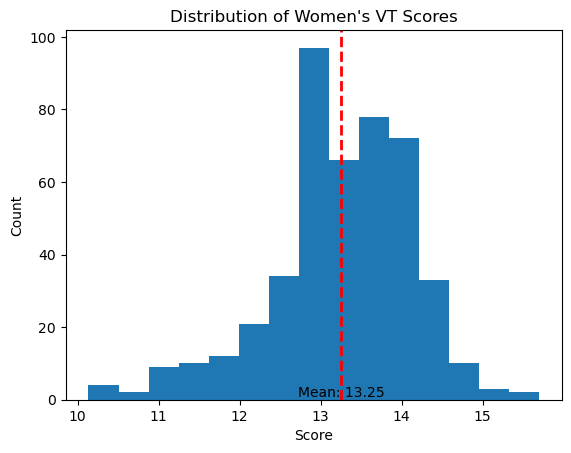

Text(0.5, 1.0, "Box Plot Distribution of Women's VT")

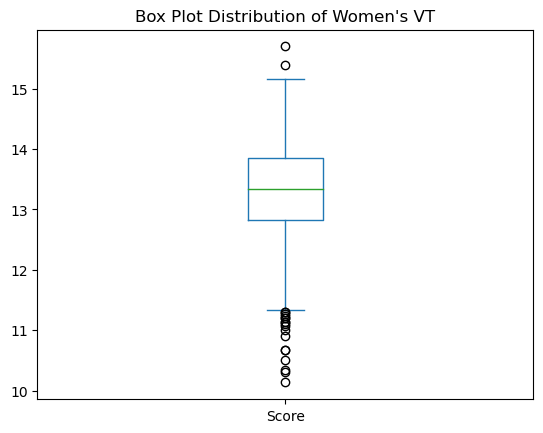

In [69]:
sr_athletes_df = sr_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
sr_athletes_df['Mean_Score'] = sr_athletes_df['Mean_Score'].round(2)
sr_athletes_df['Mean_D_Score'] = sr_athletes_df['Mean_D_Score'].round(2)
sr_athletes_df['Mean_E_Score'] = sr_athletes_df['Mean_E_Score'].round(2)
sr_athletes_df = sr_athletes_df.sort_values('Mean_Score', ascending=False)
sr_athletes_df.index = range(1, len(sr_athletes_df) + 1)
sr_athletes_df.head(10)

### Score distribution of all competitors

men_SR = men_data[men_data['Apparatus'] == 'VT']
men_SR_avg = men_SR['Score'].mean()
plt.hist(men_SR['Score'], bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Women's VT Scores")
plt.axvline(men_SR_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_SR_avg, 0, f'Mean: {men_SR_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

ax = men_SR['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Women's VT")

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

data = pd.read_csv('women_raw_1_14_2.csv')


apparatus_map = {'VT': 'VT', 'VT1': 'VT', 'VT2': 'VT'}
data['Apparatus_Combined'] = data['Apparatus'].replace(apparatus_map)

grouped_mean = data.groupby(['name', 'Country', 'Apparatus_Combined'])['Score'].mean()
grouped_std = data.groupby(['name', 'Country', 'Apparatus_Combined'])['Score'].std()
grouped_count = data.groupby(['name', 'Country', 'Apparatus_Combined'])['Score'].count()
grouped_d_mean = data.groupby(['name', 'Country', 'Apparatus_Combined'])['D_Score'].mean()
grouped_d_std = data.groupby(['name', 'Country', 'Apparatus_Combined'])['D_Score'].std()
grouped_e_mean = data.groupby(['name', 'Country', 'Apparatus_Combined'])['E_Score'].mean()
grouped_e_std = data.groupby(['name', 'Country', 'Apparatus_Combined'])['E_Score'].std()

# Unstack the groupby results for D_Score and E_Score
mean_scores_df = grouped_mean.unstack(level='Apparatus_Combined')
std_scores_df = grouped_std.unstack(level='Apparatus_Combined')
count_scores_df = grouped_count.unstack(level='Apparatus_Combined')
d_mean_scores_df = grouped_d_mean.unstack(level='Apparatus_Combined')
d_std_scores_df = grouped_d_std.unstack(level='Apparatus_Combined')
e_mean_scores_df = grouped_e_mean.unstack(level='Apparatus_Combined')
e_std_scores_df = grouped_e_std.unstack(level='Apparatus_Combined')

# Flatten the MultiIndex on the columns
mean_scores_df.columns = [f'{col}_mean_score' for col in mean_scores_df.columns]
std_scores_df.columns = [f'{col}_std' for col in std_scores_df.columns]
count_scores_df.columns = [f'{col}_count' for col in count_scores_df.columns]
d_mean_scores_df.columns = [f'{col}_D_mean_score' for col in d_mean_scores_df.columns]
d_std_scores_df.columns = [f'{col}_D_std' for col in d_std_scores_df.columns]
e_mean_scores_df.columns = [f'{col}_E_mean_score' for col in e_mean_scores_df.columns]
e_std_scores_df.columns = [f'{col}_E_std' for col in e_std_scores_df.columns]

# Calculate the standard deviation of all scores for each athlete
all_scores_std = data.groupby(['name', 'Country'])['Score'].std()

# Join the new statistics to the combined DataFrame
combined_scores_df = pd.concat([
    mean_scores_df,
    std_scores_df, 
    count_scores_df,
    d_mean_scores_df, 
    d_std_scores_df,
    e_mean_scores_df,
    e_std_scores_df
], axis=1)

# Reset the index to include 'Country' if you had previously removed it
combined_scores_df.reset_index(inplace=True)

# Add the standard deviation of all scores for each athlete as a new column
combined_scores_df = combined_scores_df.merge(all_scores_std.rename('all_scores_std'), on=['name', 'Country'])


apparatus_list=['FX','VT','BB','UB']
# Extract the base apparatus names from the mean score columns
apparatus_base_names = [col.replace('_mean_score', '') for col in combined_scores_df.columns if '_mean_score' in col]
new_column_order = ['name', 'Country']  # Start with the 'name' and 'Country' columns

# Loop over the base names and append the desired columns in the specified order
for base_name in apparatus_list:
    new_column_order.extend([
        f'{base_name}_mean_score',
        f'{base_name}_std',
        f'{base_name}_count',
        f'{base_name}_D_mean_score',
        f'{base_name}_D_std',
        f'{base_name}_E_mean_score',
        f'{base_name}_E_std'
    ])

# Rearrange the columns using the new column order
new_column_order=new_column_order+['all_scores_std']
combined_scores_df = combined_scores_df[new_column_order]
combined_scores_df.fillna(0, inplace=True)
combined_scores_df=combined_scores_df.round(2)
combined_scores_df




combined_scores_df['Standardized_Score_Sum']=combined_scores_df['FX_mean_score']+combined_scores_df['BB_mean_score']+combined_scores_df['UB_mean_score']+combined_scores_df['VT_mean_score']
combined_scores_df['Total_Appearances']=combined_scores_df['FX_count']+combined_scores_df['BB_count']+combined_scores_df['UB_count']+combined_scores_df['VT_count']

count_columns = [col for col in combined_scores_df.columns if '_count' in col]

# Sum up the non-zero counts for each athlete
combined_scores_df['apparatus_participated'] = combined_scores_df[count_columns].apply(lambda row: (row > 0).sum(), axis=1)
apparatus_list = ['FX','VT','BB','UB']  # Replace with your actual apparatus list if different
combined_scores_df['mean_score_of_all'] = sum(combined_scores_df[f'{app}_mean_score'] * combined_scores_df[f'{app}_count'] for app in apparatus_list)/combined_scores_df['Total_Appearances']
combined_scores_df['mean_score_of_all']=combined_scores_df['mean_score_of_all'].round(2)
combined_scores_df.sort_values('Standardized_Score_Sum',ascending=False,inplace=True)
combined_scores_df['all_scores_std']=combined_scores_df['all_scores_std'].round(2)
combined_scores_df

combined_scores_df.to_csv('women_individual_df.csv')

In [64]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [65]:
data = pd.read_csv('men_data_noCaiJi_Nov30.csv')
data=data[data['Country']=='USA']

In [66]:
apparatus_map = {'VT': 'VT', 'VT1': 'VT', 'VT2': 'VT'}
data['Apparatus_Combined'] = data['Apparatus'].replace(apparatus_map)

grouped_mean = data.groupby(['name', 'Country', 'Apparatus_Combined'])['Score'].mean()
grouped_std = data.groupby(['name', 'Country', 'Apparatus_Combined'])['Score'].std()
grouped_count = data.groupby(['name', 'Country', 'Apparatus_Combined'])['Score'].count()
grouped_d_mean = data.groupby(['name', 'Country', 'Apparatus_Combined'])['D_Score'].mean()
grouped_d_std = data.groupby(['name', 'Country', 'Apparatus_Combined'])['D_Score'].std()
grouped_e_mean = data.groupby(['name', 'Country', 'Apparatus_Combined'])['E_Score'].mean()
grouped_e_std = data.groupby(['name', 'Country', 'Apparatus_Combined'])['E_Score'].std()

# Unstack the groupby results for D_Score and E_Score
mean_scores_df = grouped_mean.unstack(level='Apparatus_Combined')
std_scores_df = grouped_std.unstack(level='Apparatus_Combined')
count_scores_df = grouped_count.unstack(level='Apparatus_Combined')
d_mean_scores_df = grouped_d_mean.unstack(level='Apparatus_Combined')
d_std_scores_df = grouped_d_std.unstack(level='Apparatus_Combined')
e_mean_scores_df = grouped_e_mean.unstack(level='Apparatus_Combined')
e_std_scores_df = grouped_e_std.unstack(level='Apparatus_Combined')

# Flatten the MultiIndex on the columns
mean_scores_df.columns = [f'{col}_mean_score' for col in mean_scores_df.columns]
std_scores_df.columns = [f'{col}_std' for col in std_scores_df.columns]
count_scores_df.columns = [f'{col}_count' for col in count_scores_df.columns]
d_mean_scores_df.columns = [f'{col}_D_mean_score' for col in d_mean_scores_df.columns]
d_std_scores_df.columns = [f'{col}_D_std' for col in d_std_scores_df.columns]
e_mean_scores_df.columns = [f'{col}_E_mean_score' for col in e_mean_scores_df.columns]
e_std_scores_df.columns = [f'{col}_E_std' for col in e_std_scores_df.columns]

# Calculate the standard deviation of all scores for each athlete
all_scores_std = data.groupby(['name', 'Country'])['Score'].std()

# Join the new statistics to the combined DataFrame
combined_scores_df = pd.concat([
    mean_scores_df,
    std_scores_df, 
    count_scores_df,
    d_mean_scores_df, 
    d_std_scores_df,
    e_mean_scores_df,
    e_std_scores_df
], axis=1)

# Reset the index to include 'Country' if you had previously removed it
combined_scores_df.reset_index(inplace=True)

# Add the standard deviation of all scores for each athlete as a new column
combined_scores_df = combined_scores_df.merge(all_scores_std.rename('all_scores_std'), on=['name', 'Country'])


In [67]:
apparatus_list=['FX','VT','HB','PB','SR','PH']
# Extract the base apparatus names from the mean score columns
apparatus_base_names = [col.replace('_mean_score', '') for col in combined_scores_df.columns if '_mean_score' in col]
new_column_order = ['name', 'Country']  # Start with the 'name' and 'Country' columns

# Loop over the base names and append the desired columns in the specified order
for base_name in apparatus_list:
    new_column_order.extend([
        f'{base_name}_mean_score',
        f'{base_name}_std',
        f'{base_name}_count',
        f'{base_name}_D_mean_score',
        f'{base_name}_D_std',
        f'{base_name}_E_mean_score',
        f'{base_name}_E_std'
    ])

# Rearrange the columns using the new column order
new_column_order=new_column_order+['all_scores_std']
combined_scores_df = combined_scores_df[new_column_order]
combined_scores_df.fillna(0, inplace=True)
combined_scores_df=combined_scores_df.round(2)
combined_scores_df




,name,Country,FX_mean_score,FX_std,FX_count,FX_D_mean_score,FX_D_std,FX_E_mean_score,FX_E_std,VT_mean_score,...,SR_E_mean_score,SR_E_std,PH_mean_score,PH_std,PH_count,PH_D_mean_score,PH_D_std,PH_E_mean_score,PH_E_std,all_scores_std
0,Adriel Perales-valencia,USA,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,...,7.45,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.74
1,Aidan Cuy,USA,12.90,0.00,1.0,4.70,0.00,8.20,0.00,13.80,...,8.00,0.28,10.30,0.00,1.0,3.70,0.00,6.60,0.00,1.10
2,Alex Diab,USA,13.23,0.30,4.0,5.58,0.19,7.75,0.18,13.18,...,8.12,0.31,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.55
3,Alex Karadzhov,USA,12.25,0.42,2.0,4.20,0.00,8.05,0.42,12.90,...,8.78,0.04,11.77,0.81,2.0,4.50,0.71,7.28,0.11,0.61
4,Alex Tapanes,USA,11.15,0.00,1.0,5.00,0.00,6.45,0.00,13.35,...,8.25,0.21,12.10,1.34,2.0,4.65,0.49,7.45,0.85,1.43
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158,Yul Moldauer,USA,14.02,0.61,10.0,5.63,0.12,8.39,0.52,14.25,...,8.14,0.21,13.26,0.70,11.0,5.78,0.33,7.48,0.44,0.93
159,Yul kyung tae Moldauer,USA,14.30,0.28,2.0,5.70,0.00,8.60,0.28,14.43,...,8.13,0.28,13.75,0.54,2.0,6.10,0.00,7.65,0.54,0.40
160,Zachary Cipra,USA,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,...,5.70,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00
161,Zachary Marckx,USA,12.85,0.00,1.0,4.30,0.00,8.55,0.00,0.00,...,7.60,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.18


In [68]:
combined_scores_df['Standardized_Score_Sum']=combined_scores_df['FX_mean_score']+combined_scores_df['HB_mean_score']+combined_scores_df['PB_mean_score']+combined_scores_df['PH_mean_score']+combined_scores_df['SR_mean_score']+combined_scores_df['VT_mean_score']
combined_scores_df['Total_Appearances']=combined_scores_df['FX_count']+combined_scores_df['HB_count']+combined_scores_df['PB_count']+combined_scores_df['PH_count']+combined_scores_df['SR_count']+combined_scores_df['VT_count']

In [69]:
count_columns = [col for col in combined_scores_df.columns if '_count' in col]

# Sum up the non-zero counts for each athlete
combined_scores_df['apparatus_participated'] = combined_scores_df[count_columns].apply(lambda row: (row > 0).sum(), axis=1)
apparatus_list = ['FX','VT','HB','PB','SR','PH']  # Replace with your actual apparatus list if different
combined_scores_df['mean_score_of_all'] = sum(combined_scores_df[f'{app}_mean_score'] * combined_scores_df[f'{app}_count'] for app in apparatus_list)/combined_scores_df['Total_Appearances']
combined_scores_df['mean_score_of_all']=combined_scores_df['mean_score_of_all'].round(2)
combined_scores_df.sort_values('Standardized_Score_Sum',ascending=False,inplace=True)
combined_scores_df['all_scores_std']=combined_scores_df['all_scores_std'].round(2)
combined_scores_df

,name,Country,FX_mean_score,FX_std,FX_count,FX_D_mean_score,FX_D_std,FX_E_mean_score,FX_E_std,VT_mean_score,...,PH_count,PH_D_mean_score,PH_D_std,PH_E_mean_score,PH_E_std,all_scores_std,Standardized_Score_Sum,Total_Appearances,apparatus_participated,mean_score_of_all
20,Brody Malone,USA,13.71,0.78,7.0,5.91,0.20,7.82,0.65,14.47,...,10.0,5.86,0.17,7.79,0.74,0.63,84.57,57.0,6,14.11
159,Yul kyung tae Moldauer,USA,14.30,0.28,2.0,5.70,0.00,8.60,0.28,14.43,...,2.0,6.10,0.00,7.65,0.54,0.40,84.39,10.0,6,14.08
155,Vitaliy Guimaraes,USA,14.25,0.00,1.0,5.50,0.00,8.75,0.00,14.45,...,1.0,5.20,0.00,9.15,0.00,0.43,83.95,6.0,6,13.99
124,Paul Juda,USA,14.34,0.34,6.0,5.60,0.17,8.76,0.32,14.50,...,4.0,5.48,0.39,7.98,0.76,0.50,83.75,41.0,6,14.08
59,Frederick Richard,USA,14.14,0.49,7.0,6.01,0.04,8.20,0.49,14.32,...,6.0,5.68,0.50,7.65,0.87,0.69,83.60,36.0,6,13.96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,Parker Thackston,USA,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,...,1.0,5.90,0.00,6.60,0.00,0.00,12.50,1.0,1,12.50
102,Maddox Pabellon,USA,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,...,1.0,5.10,0.00,6.95,0.00,0.00,12.05,1.0,1,12.05
126,Reuven Anderson,USA,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,...,0.0,0.00,0.00,0.00,0.00,0.00,11.65,1.0,1,11.65
33,Clayton Cunningham,USA,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,...,1.0,5.10,0.00,5.85,0.00,0.00,10.95,1.0,1,10.95


In [70]:
combined_scores_df.to_csv('men_individual_df.csv')

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [26]:
data = pd.read_csv('women_raw_1_14_2.csv')


In [27]:
apparatus_map = {'VT': 'VT', 'VT1': 'VT', 'VT2': 'VT'}
data['Apparatus_Combined'] = data['Apparatus'].replace(apparatus_map)

grouped_mean = data.groupby(['name', 'Country', 'Apparatus_Combined'])['Score'].mean()
grouped_std = data.groupby(['name', 'Country', 'Apparatus_Combined'])['Score'].std()
grouped_count = data.groupby(['name', 'Country', 'Apparatus_Combined'])['Score'].count()
grouped_d_mean = data.groupby(['name', 'Country', 'Apparatus_Combined'])['D_Score'].mean()
grouped_d_std = data.groupby(['name', 'Country', 'Apparatus_Combined'])['D_Score'].std()
grouped_e_mean = data.groupby(['name', 'Country', 'Apparatus_Combined'])['E_Score'].mean()
grouped_e_std = data.groupby(['name', 'Country', 'Apparatus_Combined'])['E_Score'].std()

# Unstack the groupby results for D_Score and E_Score
mean_scores_df = grouped_mean.unstack(level='Apparatus_Combined')
std_scores_df = grouped_std.unstack(level='Apparatus_Combined')
count_scores_df = grouped_count.unstack(level='Apparatus_Combined')
d_mean_scores_df = grouped_d_mean.unstack(level='Apparatus_Combined')
d_std_scores_df = grouped_d_std.unstack(level='Apparatus_Combined')
e_mean_scores_df = grouped_e_mean.unstack(level='Apparatus_Combined')
e_std_scores_df = grouped_e_std.unstack(level='Apparatus_Combined')

# Flatten the MultiIndex on the columns
mean_scores_df.columns = [f'{col}_mean_score' for col in mean_scores_df.columns]
std_scores_df.columns = [f'{col}_std' for col in std_scores_df.columns]
count_scores_df.columns = [f'{col}_count' for col in count_scores_df.columns]
d_mean_scores_df.columns = [f'{col}_D_mean_score' for col in d_mean_scores_df.columns]
d_std_scores_df.columns = [f'{col}_D_std' for col in d_std_scores_df.columns]
e_mean_scores_df.columns = [f'{col}_E_mean_score' for col in e_mean_scores_df.columns]
e_std_scores_df.columns = [f'{col}_E_std' for col in e_std_scores_df.columns]

# Calculate the standard deviation of all scores for each athlete
all_scores_std = data.groupby(['name', 'Country'])['Score'].std()

# Join the new statistics to the combined DataFrame
combined_scores_df = pd.concat([
    mean_scores_df,
    std_scores_df, 
    count_scores_df,
    d_mean_scores_df, 
    d_std_scores_df,
    e_mean_scores_df,
    e_std_scores_df
], axis=1)

# Reset the index to include 'Country' if you had previously removed it
combined_scores_df.reset_index(inplace=True)

# Add the standard deviation of all scores for each athlete as a new column
combined_scores_df = combined_scores_df.merge(all_scores_std.rename('all_scores_std'), on=['name', 'Country'])


In [28]:
apparatus_list=['FX','VT','BB','UB']
# Extract the base apparatus names from the mean score columns
apparatus_base_names = [col.replace('_mean_score', '') for col in combined_scores_df.columns if '_mean_score' in col]
new_column_order = ['name', 'Country']  # Start with the 'name' and 'Country' columns

# Loop over the base names and append the desired columns in the specified order
for base_name in apparatus_list:
    new_column_order.extend([
        f'{base_name}_mean_score',
        f'{base_name}_std',
        f'{base_name}_count',
        f'{base_name}_D_mean_score',
        f'{base_name}_D_std',
        f'{base_name}_E_mean_score',
        f'{base_name}_E_std'
    ])

# Rearrange the columns using the new column order
new_column_order=new_column_order+['all_scores_std']
combined_scores_df = combined_scores_df[new_column_order]
combined_scores_df.fillna(0, inplace=True)
combined_scores_df=combined_scores_df.round(2)
combined_scores_df




,name,Country,FX_mean_score,FX_std,FX_count,FX_D_mean_score,FX_D_std,FX_E_mean_score,FX_E_std,VT_mean_score,...,BB_E_mean_score,BB_E_std,UB_mean_score,UB_std,UB_count,UB_D_mean_score,UB_D_std,UB_E_mean_score,UB_E_std,all_scores_std
0,ABBY MEADOW,GBR,10.65,0.00,1.0,3.80,0.00,7.15,0.00,11.80,...,4.70,0.00,4.95,0.00,1.0,2.20,0.00,6.75,0.00,3.00
1,ABERDEEN O DRISCOLL,BEL,12.83,0.00,1.0,5.00,0.00,7.83,0.00,13.13,...,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.21
2,ABERDEEN O'DRISCOL,BEL,12.85,0.00,1.0,5.00,0.00,7.85,0.00,12.95,...,6.10,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,1.62
3,ABIGAIL ROPER,GBR,11.58,0.04,2.0,4.45,0.07,7.12,0.11,12.67,...,6.82,0.25,10.72,0.18,2.0,4.15,0.07,6.58,0.11,0.81
4,ADA HAUTALA,FIN,12.28,0.40,8.0,4.71,0.21,7.64,0.20,12.82,...,6.23,0.96,10.83,1.81,7.0,4.56,0.49,6.27,1.43,1.29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782,ZHUOFAN HUANG,CHN,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,14.61,0.13,3.0,6.50,0.00,8.11,0.13,0.13
783,ZI XUAN SHANDY POH,SGP,11.18,0.12,2.0,4.15,0.07,7.08,0.02,11.57,...,6.80,0.09,9.17,1.04,2.0,3.60,0.00,5.57,1.04,1.10
784,ZOE MILLER,USA,12.04,0.65,6.0,5.12,0.10,7.02,0.44,13.57,...,7.08,0.66,14.01,1.26,9.0,6.24,0.37,7.80,0.83,1.19
785,ZOJA SZEKELY,HUN,12.15,0.16,6.0,4.57,0.08,7.58,0.12,12.97,...,6.89,0.65,13.36,0.64,16.0,5.79,0.20,7.57,0.54,0.91


In [31]:
combined_scores_df['Standardized_Score_Sum']=combined_scores_df['FX_mean_score']+combined_scores_df['BB_mean_score']+combined_scores_df['UB_mean_score']+combined_scores_df['VT_mean_score']
combined_scores_df['Total_Appearances']=combined_scores_df['FX_count']+combined_scores_df['BB_count']+combined_scores_df['UB_count']+combined_scores_df['VT_count']

In [32]:
count_columns = [col for col in combined_scores_df.columns if '_count' in col]

# Sum up the non-zero counts for each athlete
combined_scores_df['apparatus_participated'] = combined_scores_df[count_columns].apply(lambda row: (row > 0).sum(), axis=1)
apparatus_list = ['FX','VT','BB','UB']  # Replace with your actual apparatus list if different
combined_scores_df['mean_score_of_all'] = sum(combined_scores_df[f'{app}_mean_score'] * combined_scores_df[f'{app}_count'] for app in apparatus_list)/combined_scores_df['Total_Appearances']
combined_scores_df['mean_score_of_all']=combined_scores_df['mean_score_of_all'].round(2)
combined_scores_df.sort_values('Standardized_Score_Sum',ascending=False,inplace=True)
combined_scores_df['all_scores_std']=combined_scores_df['all_scores_std'].round(2)
combined_scores_df

,name,Country,FX_mean_score,FX_std,FX_count,FX_D_mean_score,FX_D_std,FX_E_mean_score,FX_E_std,VT_mean_score,...,UB_count,UB_D_mean_score,UB_D_std,UB_E_mean_score,UB_E_std,all_scores_std,Standardized_Score_Sum,Total_Appearances,apparatus_participated,mean_score_of_all
675,SIMONE BILES,USA,14.87,0.32,7.0,6.71,0.11,8.18,0.25,14.98,...,7.0,6.00,0.00,8.26,0.18,0.41,58.71,30.0,4,14.70
608,REBECA ANDRADE,BRA,14.21,0.30,8.0,6.06,0.11,8.18,0.24,14.66,...,11.0,6.11,0.14,8.12,0.47,0.78,56.60,44.0,4,14.21
668,SHILESE JONES,USA,13.70,0.42,14.0,5.62,0.16,8.11,0.28,14.29,...,15.0,6.29,0.08,8.22,0.42,0.69,55.82,53.0,4,13.96
397,KONNOR MCCLAIN,USA,13.63,0.42,3.0,5.60,0.35,8.03,0.08,14.28,...,3.0,5.60,0.20,7.67,0.60,0.67,55.68,12.0,4,13.92
336,JESSICA ROSE GADIROVA,GBR,14.10,0.35,14.0,5.86,0.18,8.26,0.21,13.93,...,12.0,5.58,0.14,7.81,0.41,0.56,54.67,58.0,4,13.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
411,LARASATI REGGANIS,INA,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,...,1.0,2.50,0.00,6.37,0.00,0.00,8.87,1.0,1,8.87
511,MAYA SHAABAN,EGY,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,...,0.0,0.00,0.00,0.00,0.00,0.00,8.65,1.0,1,8.65
377,KATYNA ALICEA,PUR,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,...,0.0,0.00,0.00,0.00,0.00,0.00,8.60,1.0,1,8.60
451,LUCIA GUTIERREZ,PHI,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,...,1.0,3.80,0.00,4.77,0.00,0.00,8.57,1.0,1,8.57


In [33]:
combined_scores_df.to_csv('women_individual_df.csv')

In [71]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [72]:
men_data = pd.read_csv('men_individual_df.csv')
men_data.head()

,Unnamed: 0,name,Country,FX_mean_score,FX_std,FX_count,FX_D_mean_score,FX_D_std,FX_E_mean_score,FX_E_std,...,PH_count,PH_D_mean_score,PH_D_std,PH_E_mean_score,PH_E_std,all_scores_std,Standardized_Score_Sum,Total_Appearances,apparatus_participated,mean_score_of_all
0,112,BOHENG ZHANG,CHN,14.43,0.26,8.0,6.02,0.14,8.42,0.18,...,8.0,5.82,0.14,8.01,0.87,0.76,86.56,46.0,6,14.43
1,496,KAZUMA KAYA,JPN,13.84,0.49,6.0,5.70,0.00,8.16,0.50,...,7.0,6.31,0.11,8.05,0.17,0.38,85.41,35.0,6,14.27
2,934,WATARU TANIGAWA,JPN,13.94,0.50,4.0,5.70,0.08,8.27,0.51,...,2.0,5.85,0.07,7.90,0.05,0.52,85.27,30.0,6,14.34
3,173,CONG SHI,CHN,13.87,0.03,3.0,5.53,0.23,8.33,0.20,...,4.0,5.68,0.10,8.06,0.46,0.59,84.97,23.0,6,14.21
4,181,DAIKI HASHIMOTO,JPN,14.26,0.50,10.0,5.95,0.08,8.32,0.45,...,9.0,5.90,0.25,7.98,0.84,1.55,84.66,51.0,6,14.15


## Men's Floor Exercise

### Top 15 Athletes in FX by mean_score (3+ Apperances)

In [73]:
FX_data = men_data[men_data['FX_count']>3]
FX_data=FX_data[['name','Country','FX_mean_score','FX_std','FX_count','FX_D_mean_score','FX_D_std','FX_E_mean_score','FX_E_std']]
FX_data.sort_values(by='FX_mean_score', ascending=False).head(15)

,name,Country,FX_mean_score,FX_std,FX_count,FX_D_mean_score,FX_D_std,FX_E_mean_score,FX_E_std
16,RYOSUKE DOI,JPN,14.56,0.27,5.0,6.20,0.00,8.40,0.24
6,CARLOS YULO,PHI,14.51,0.76,13.0,6.35,0.09,8.20,0.70
0,BOHENG ZHANG,CHN,14.43,0.26,8.0,6.02,0.14,8.42,0.18
9,PAUL JUDA,USA,14.34,0.34,6.0,5.60,0.17,8.76,0.32
747,KAZUKI MINAMI,JPN,14.31,0.40,7.0,6.36,0.13,7.99,0.41
8,KAKERU TANIGAWA,JPN,14.27,0.19,4.0,5.70,0.20,8.65,0.16
36,ARTEM DOLGOPYAT,ISR,14.27,1.04,23.0,6.21,0.19,8.14,0.89
4,DAIKI HASHIMOTO,JPN,14.26,0.50,10.0,5.95,0.08,8.32,0.45
27,JAKE JARMAN,GBR,14.21,0.48,19.0,6.33,0.40,7.91,0.56
538,HANSOL KIM,KOR,14.21,0.58,6.0,6.00,0.00,8.21,0.58


#### The best USA athelete in FX is Paul Juda, ranking 4th in mean_score. He has no obvious advantage comparing to top 3, with lower score, greater sd, meaning less stable performance. He has a low D_score but high E_score, so more like someone who takes lower risks.

### Distribution of Individual's FX Mean Score

In [4]:
fig = go.Figure(data=[go.Histogram(x=FX_data['FX_mean_score'],nbinsx=20)])
fig.update_layout(
    title='Histogram of FX mean score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### The distribution of FX's score is left skewed. Only 3% of athletes have a mean score above 14.3, showing a rather distinct group of elite atheletes on top level. The "best athlete" is Carlos Yulo from Philppines, who scored on average 15.0 in 4 appearances, with 0.21 sd.

### Distribution of Individual's SD

In [40]:
filter_data = FX_data[FX_data['FX_std']<5]
fig = go.Figure(data=[go.Histogram(x=filter_data['FX_std'],nbinsx=10)])
fig.update_layout(
    title='Histogram of FX SD',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### It's hard to distinguish athletes by SD, as only 7 have extremely low SD <0.2, but and most above that there's little distinction.

In [6]:
FX_sd_of_sd=filter_data['FX_std'].std()
FX_mean_sd=filter_data['FX_std'].mean()
print(FX_mean_sd.round(2),round(FX_sd_of_sd,2))

0.73 0.53


#### For FX, the mean of sd is 0.73, the sd of sd is 0.53. This shows a most atheletes show some instability in FX performances, but there is not a big enough distinction between atheletes.

### Distribution of D_Score

In [7]:
fig = go.Figure(data=[go.Histogram(x=FX_data['FX_D_mean_score'],nbinsx=20)])
fig.update_layout(
    title='Histogram of FX D_Score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### The distribution of D_Score shows a big gap at 6.1, meaning that few athletes can make a D_Score above 6.1, meaning that they perform very hard routines and have bonus points.

### Distribution of FX E_Score

In [8]:
fig = go.Figure(data=[go.Histogram(x=FX_data['FX_E_mean_score'],nbinsx=20)])
fig.update_layout(
    title='Histogram of FX E_Score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### The E_Score distribution is quite unimodal, showing that a decent amount of athletes can get a fairly high E_Score, but few get an exceptionally high E_Score (10 people above 8.4).

### Conclusion

### In general, FX relies quite heavily on D_Score to be separated from the others. Most athletes cannot perform very consistently in this apparatus. The top 3 atheletes from Philippines, China, and Japan have strong advantage and stable performance, Paul Juda from USA comes fourth and have no unique advantage, as he has a significantly lower D_score than the other 3. It is unlikely for USA to win gold medal on this appratus.

## Men's Horizontal Bar

### Top 15 Athletes in HB by mean_score (3+ Apperances)

In [9]:
HB_data = men_data[men_data['HB_count']>3]
HB_data=HB_data[['name','Country','HB_mean_score','HB_std','HB_count','HB_D_mean_score','HB_D_std','HB_E_mean_score','HB_E_std']]
HB_data.sort_values(by='HB_mean_score', ascending=False).head(15)

,name,Country,HB_mean_score,HB_std,HB_count,HB_D_mean_score,HB_D_std,HB_E_mean_score,HB_E_std
4,DAIKI HASHIMOTO,JPN,14.63,0.59,11.0,6.26,0.37,8.37,0.32
0,BOHENG ZHANG,CHN,14.52,0.71,9.0,6.18,0.38,8.34,0.40
5,BRODY MALONE,USA,14.37,0.58,13.0,6.08,0.31,8.29,0.37
12,WEI SUN,CHN,14.31,0.48,6.0,6.18,0.23,8.12,0.27
391,CHAOPAN LIN,CHN,14.31,0.33,5.0,6.00,0.07,8.31,0.32
3,CONG SHI,CHN,14.31,0.76,5.0,6.10,0.28,8.21,0.54
624,YUYA KAMOTO,JPN,14.24,0.12,5.0,5.94,0.13,8.30,0.11
28,SHOHEI KAWAKAMI,JPN,14.23,0.35,6.0,6.23,0.08,8.00,0.33
1,KAZUMA KAYA,JPN,14.08,0.08,6.0,5.88,0.04,8.19,0.07
856,TIN SRBIC,CRO,13.99,0.45,20.0,5.70,0.21,8.30,0.40


#### The best USA athlete in HB is Brody Malone, with 14.37 mean score and 0.58 mean, 13 appearances. He is rather stable compared to the 2nd, Boheng Zhang, with a much lower sd. However, he has no apprent advantage over top 1, Daiki Hashimoto from Japan, who is higher in every score possible.

### Distribution of Individual's HB Mean Score

In [10]:
fig = go.Figure(data=[go.Histogram(x=HB_data['HB_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of HB mean score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### There are more contenders with high mean scores, 9 atheletes above 14, but only 2 above 14.4. 

### Distribution of Individual's HB SD

In [11]:
fig = go.Figure(data=[go.Histogram(x=HB_data['HB_std'],nbinsx=25)])
fig.update_layout(
    title='Histogram of HB SD',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### Performance on HB is generally more stable with a smaller SD, but difference between atheletes is quite high. It's easier to distinguish stable performers with others.

In [12]:
HB_sd_of_sd=HB_data['HB_std'].std()
HB_mean_sd=HB_data['HB_std'].mean()
print(HB_mean_sd.round(2),round(HB_sd_of_sd,2))

0.76 0.5


### Distribution of HB D_Score

In [13]:
fig = go.Figure(data=[go.Histogram(x=HB_data['HB_D_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of HB D_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### There is smaller difference in D_score among top-performers. Quite a few atheletes are able to achieve a high D_score above 5.9 (9 atheletes).

### Distribution of HB E_Score

In [14]:
fig = go.Figure(data=[go.Histogram(x=HB_data['HB_E_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of HB E_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### For each score, the best atheletes are distinguished from others, with 8 atheletes above 8.4. Below that, it is all clustered together.
### Conclusion
### For HB, USA has one outstanding athelete Brody Malone, who has some hope in winning the medal but there are still one definitely better than him. HB as an appratus disinguishes atheletes further, creating a gap between mediocre atheletes and the best. D_score seems to matter less in HB, and it's important to achieve a high E_score that sets atheletes apart.
## Men's Parallel Bars

### Top 15 Athletes in PB by mean_score (3+ Apperances)

In [15]:
PB_data = men_data[men_data['PB_count']>3]
PB_data=PB_data[['name','Country','PB_mean_score','PB_std','PB_count','PB_D_mean_score','PB_D_std','PB_E_mean_score','PB_E_std']]
PB_data.sort_values(by='PB_mean_score', ascending=False).head(15)

,name,Country,PB_mean_score,PB_std,PB_count,PB_D_mean_score,PB_D_std,PB_E_mean_score,PB_E_std
618,JINGYUAN ZOU,CHN,15.92,0.16,7.0,6.61,0.20,9.30,0.11
35,LUKAS DAUSER,GER,15.15,0.57,10.0,6.54,0.13,8.61,0.44
6,CARLOS YULO,PHI,15.08,0.29,14.0,6.34,0.11,8.73,0.27
0,BOHENG ZHANG,CHN,15.02,0.53,8.0,6.31,0.25,8.71,0.40
15,ILLIA KOVTUN,UKR,14.98,0.29,30.0,6.40,0.17,8.58,0.25
533,KAITO SUGIMOTO,JPN,14.95,0.13,5.0,6.30,0.00,8.65,0.13
397,DEHANG YIN,CHN,14.88,0.17,4.0,6.40,0.00,8.48,0.17
2,WATARU TANIGAWA,JPN,14.86,0.07,4.0,6.30,0.00,8.56,0.07
3,CONG SHI,CHN,14.84,0.16,5.0,6.18,0.16,8.66,0.08
626,CURRAN PHILLIPS,USA,14.74,0.78,15.0,6.72,0.19,8.02,0.65


#### The best USA athelete in parallel bars is Curran Phillips, ranking 7th in the appratus. He is far behind the best in the apparatus, Jingyuan Zou, who has a much higher score on average and performs more consistently. However, Curren Phillips has the highest mean D_score among top 15, but has a lower E_score, indicating that he would take risks and attempt harder routines.
### Distribution of Men's PB Mean Score

In [16]:
fig = go.Figure(data=[go.Histogram(x=PB_data['PB_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of PB mean score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### One athelete sets himself apart from all others. In the second tier, there are 9 atheletes in the range of 14.8-15.2, which is quite a lot of top-performers. 14.2 is another cutoff point for many atheletes.
### Distribution of PB SD

In [17]:
filter_data_PB = PB_data[PB_data['PB_std']<3]
fig = go.Figure(data=[go.Histogram(x=filter_data_PB['PB_std'],nbinsx=30)])
fig.update_layout(
    title='Histogram of PB SD',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### Many atheletes are able to perform stably in PB, with 11 having a less than 0.2 SD and 31 lower than 0.3. It's hard to set atheletes apart by consistency.

In [18]:
#Get rid of outliers
filter_data_PB = PB_data[PB_data['PB_std']<2]
PB_sd_of_sd=filter_data_PB['PB_std'].std()
PB_mean_sd=filter_data_PB['PB_std'].mean()
print(PB_mean_sd.round(2),round(PB_sd_of_sd,2))

0.64 0.31


#### PB has a low mean of sd, and also a low sd of sd, meaning that atheletes are generally more consistent in this apparatus. Consistency is not what sets atheletes apart in this apparatus.
### Distribution of PB D_Score

In [19]:
fig = go.Figure(data=[go.Histogram(x=PB_data['PB_D_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of PB D_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### PB has a lot of atheletes achieving above 6, and 8 atheletes are able to score above 6.4. It means that D_score isn't what sets elite atheletes apart from each other.
### Distribution of PB's E_Score

In [20]:
fig = go.Figure(data=[go.Histogram(x=PB_data['PB_E_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of PB E_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### Only very few atheletes have high E_Scores, with 3 atheletes above 8.8, and those 3 are set apart as well. It shows that E_Score is the key difference between top-performing atheletes.
### Conclusion
### PB has an absolute leading athelete from China, and the best USA athelete is ranked 7th and has no chance winning the appratus medal. Atheletes are generally more stable in this apparatus, and many of them achieve high D_scores. What really matters in this apparatus is achieving a high E_score to be distinguished apart.
## Men's Pommel Horse
### Top 15 Athletes in PB by mean_score (3+ Apperances)

In [70]:
PH_data = men_data[men_data['PH_count']>3]
PH_data=PH_data[['name','Country','PH_mean_score','PH_std','PH_count','PH_D_mean_score','PH_D_std','PH_E_mean_score','PH_E_std']]
PH_data.sort_values(by='PH_mean_score', ascending=False).head(15)

KeyError: 'PH_count'

#### The best USA athelete in PH is Stephen Nedoroscik, ranking 5th among all. He is 0.58 points behind leading Ryota Tsumura, who has a higher D_score, E_score and better consistency. Stephen has one of the worst consistency among top 15 atheletes, but he has a relatively high D_score.
### Distribution of Men's PH Mean Score

In [42]:
fig = go.Figure(data=[go.Histogram(x=PH_data['PH_mean_score'],nbinsx=25)])

fig.update_layout(
    title='Histogram of PH mean score',
    xaxis_title='Score',
    yaxis_title='Count'
)
len(PH_data['PH_mean_score'])

235

#### 2 best atheletes have clear cut advantage in PH, and multiple top performers follow in the range of 14-14.4. The distribution is more widespread, showing that atheletes are generally more distinguished in PH.
### Distribution of Men's PH SD

In [23]:
fig = go.Figure(data=[go.Histogram(x=PH_data['PH_std'],nbinsx=30)])
fig.update_layout(
    title='Histogram of PH SD',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### For Men's Pommel Horse, there are few atheletes with low SD, meaning that the performances are generally inconsistent. 

In [24]:
#Get rid of outliers
filter_data_PH = PH_data[PH_data['PH_std']<2]
PH_sd_of_sd=filter_data_PH['PH_std'].std()
PH_mean_sd=filter_data_PH['PH_std'].mean()
print(PH_mean_sd.round(2),round(PH_sd_of_sd,2))

0.81 0.33


#### The mean of SD is high, meaning that generally atheletes' performances in PH is inconsistent.
### Distribution of PH D_Score

In [25]:
fig = go.Figure(data=[go.Histogram(x=PH_data['PH_D_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of PH D_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### Many atheletes are able to achieve a high D_score in pommel horse, meaning that it's hard to standout with D_Score.
### Distribution of PH E_Score

In [26]:
fig = go.Figure(data=[go.Histogram(x=PH_data['PH_E_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of PH E_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### Much fewer people are able to achieve a E_score higher than 8.2, meaning that E_score is what truly distinguishes good atheletes from the best.
### Conclusion
### For Pommel Horse, atheletes' performances are less consistent as their SD is large. D_score are less distinguishing than E_Score for top level atheletes. The best on USA team is Stephen Nedoroscik, who rank 4th among all and have little chance of winning gold. (but some chances in winning medal)
## Men's Still Ring
### Top 15 Athletes in SR by mean_score (3+ Apperances)

In [27]:
SR_data = men_data[men_data['SR_count']>3]
SR_data=SR_data[['name','Country','SR_mean_score','SR_std','SR_count','SR_D_mean_score','SR_D_std','SR_E_mean_score','SR_E_std']]
SR_data.sort_values(by='SR_mean_score', ascending=False).head(15)

,name,Country,SR_mean_score,SR_std,SR_count,SR_D_mean_score,SR_D_std,SR_E_mean_score,SR_E_std
635,YANG LIU,CHN,15.23,0.14,5.0,6.40,0.00,8.83,0.14
13,XINGYU LAN,CHN,15.11,0.29,9.0,6.38,0.04,8.78,0.17
618,JINGYUAN ZOU,CHN,14.80,0.32,7.0,6.27,0.13,8.53,0.23
838,ELEFTHERIOS PETROUNIAS,GRE,14.80,0.39,9.0,6.26,0.05,8.55,0.38
17,ADEM ASIL,TUR,14.78,0.27,27.0,6.29,0.03,8.48,0.26
541,HAO YOU,CHN,14.73,0.12,6.0,6.57,0.10,8.16,0.16
650,SALVATORE MARESCA,ITA,14.71,0.08,6.0,6.20,0.00,8.51,0.08
841,VAHAGN DAVTYAN,ARM,14.61,0.14,18.0,5.97,0.05,8.65,0.16
552,IBRAHIM COLAK,TUR,14.60,0.34,15.0,6.09,0.06,8.50,0.36
629,MARCO LODADIO,ITA,14.60,0.07,4.0,6.30,0.00,8.30,0.07


#### The best USA athelete in Still Rings is Donnell Whittenburg, who scores on average 14.54 with a 0.3 SD, and 15 appearances. He ranks 12th among all atheletes, 0.69 points behind the 1st ranked Yang Liu. He has a low mean D_score of 5.99 compared to other atheletes on the same level, while his E_score is on a higher level.
### Distribution of Men's SR Mean Score

In [47]:
fig = go.Figure(data=[go.Histogram(x=SR_data['SR_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of SR mean score',
    xaxis_title='Score',
    yaxis_title='Count'
)


#### It can be observed that the gap between elite atheletes and others is rather large in SR. 9 Atheletes in total could score over 14.6 on average. Top 2 atheletes are also score distinctly above others. 
### Distribution of Men's SR SD

In [29]:
fig = go.Figure(data=[go.Histogram(x=SR_data['SR_std'],nbinsx=25)])
fig.update_layout(
    title='Histogram of SR SD',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### This graph shows that many atheletes are able to perform stably in SR, with 12 people having a SD lower than 0.14.

In [30]:
#Get rid of outliers
filter_data_SR = SR_data[SR_data['SR_std']<2]
SR_sd_of_sd=filter_data_SR['SR_std'].std()
SR_mean_sd=filter_data_SR['SR_std'].mean()
print(SR_mean_sd.round(2),round(SR_sd_of_sd,2))

0.39 0.21


#### Both the mean of SD and SD of SD are very low in SR, showing that this apparatus allows consistent performance in general. 
### Distribution of SR D_Score

In [31]:
fig = go.Figure(data=[go.Histogram(x=SR_data['SR_D_mean_score'],nbinsx=250)])
fig.update_layout(
    title='Histogram of SR D_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### D_score is not very distinguishing in SR, as 9 atheletes are able to achieve an average D_Score in the top 2 tiers (6.2-6.6).
### Distribution of SR E_Score

In [32]:
fig = go.Figure(data=[go.Histogram(x=SR_data['SR_E_mean_score'],nbinsx=250)])
fig.update_layout(
    title='Histogram of SR E_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### Among the top-performing atheletes, E_score is the distinction. The highest few bins all have only 1-2 atheletes in each bin. This is where elite atheletes are distinguished in SR.
### Conclusion
### SR has some leading atheletes that are far above average ones, but unfortunately none of them are USA atheletes. There is little hope for USA winning apparatus medal in SR. This apparatus is generally consistent in atheletes' performances with lower SD in general, and E_score is what sets atheletes apart from each other.
## Men's Vault
### Top 15 Athletes in VT by mean_score (5+ Apperances)

In [33]:
VT_data = men_data[men_data['VT_count']>5]
VT_data=VT_data[['name','Country','VT_mean_score','VT_std','VT_count','VT_D_mean_score','VT_D_std','VT_E_mean_score','VT_E_std']]
VT_data.sort_values(by='VT_mean_score', ascending=False).head(30)

,name,Country,VT_mean_score,VT_std,VT_count,VT_D_mean_score,VT_D_std,VT_E_mean_score,VT_E_std
26,ARTUR DAVTYAN,ARM,14.89,0.36,50.0,5.58,0.13,9.34,0.30
187,NAZAR CHEPURNYI,UKR,14.79,0.16,30.0,5.60,0.00,9.20,0.16
27,JAKE JARMAN,GBR,14.76,0.50,42.0,5.76,0.22,9.03,0.45
6,CARLOS YULO,PHI,14.69,0.40,25.0,5.63,0.23,9.07,0.36
19,KHOI YOUNG,USA,14.69,0.30,15.0,5.47,0.21,9.26,0.23
633,IGOR RADIVILOV,UKR,14.68,0.37,33.0,5.60,0.00,9.09,0.35
2,WATARU TANIGAWA,JPN,14.65,0.44,11.0,5.64,0.33,9.02,0.21
4,DAIKI HASHIMOTO,JPN,14.64,0.40,7.0,5.60,0.00,9.13,0.28
747,KAZUKI MINAMI,JPN,14.58,0.34,10.0,5.48,0.19,9.10,0.37
425,GIARNNI REGINI MORAN,GBR,14.56,0.53,12.0,5.47,0.20,9.10,0.39


#### Due to the special rule for VT, here only atheletes with 5+ appearances are considered. The best USA athelete in VT is Khoi Young, who scores on average 14.76, ranking 3rd among all. He is only 0.13 points behind the leading scorer Artur Davtyan from Armenia. Khoi is a medal contender in this apparatus.
### Distribution of Men's VT mean score

In [48]:
fig = go.Figure(data=[go.Histogram(x=VT_data['VT_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of VT mean score',
    xaxis_title='Score',
    yaxis_title='Count'
)
len(VT_data['VT_mean_score'])

163

#### There are a handful of elite atheletes in VT, (8 scoring above 14.6), so there is tight competition on the top.
### Distribution of Men's VT SD

In [35]:
fig = go.Figure(data=[go.Histogram(x=VT_data['VT_std'],nbinsx=25)])
fig.update_layout(
    title='Histogram of VT SD',
    xaxis_title='Score',
    yaxis_title='Count'
)

In [36]:
#Get rid of outliers
filter_data_VT = VT_data[VT_data['VT_std']<2]
VT_sd_of_sd=filter_data_VT['VT_std'].std()
VT_mean_sd=filter_data_VT['VT_std'].mean()
print(VT_mean_sd.round(2),round(VT_sd_of_sd,2))

0.46 0.21


In [37]:
fig = go.Figure(data=[go.Histogram(x=VT_data['VT_D_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of VT D_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### D_score in men's VT can set atheletes apart on a higher level.

In [38]:
fig = go.Figure(data=[go.Histogram(x=VT_data['VT_E_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of VT E_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### E_score is clustered on the higher end, so it's not very distinguishing for elite atheletes.
### Conclusion
### In VT, USA has one 3rd athelete that can compete for medal. D_score is more important than E_score in VT, and performance is generally stable.

In [74]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

women_data = pd.read_csv('women_individual_df.csv')
women_data.head()

,Unnamed: 0,name,Country,FX_mean_score,FX_std,FX_count,FX_D_mean_score,FX_D_std,FX_E_mean_score,FX_E_std,...,UB_count,UB_D_mean_score,UB_D_std,UB_E_mean_score,UB_E_std,all_scores_std,Standardized_Score_Sum,Total_Appearances,apparatus_participated,mean_score_of_all
0,675,SIMONE BILES,USA,14.87,0.32,7.0,6.71,0.11,8.18,0.25,...,7.0,6.00,0.00,8.26,0.18,0.41,58.71,30.0,4,14.70
1,608,REBECA ANDRADE,BRA,14.21,0.30,8.0,6.06,0.11,8.18,0.24,...,11.0,6.11,0.14,8.12,0.47,0.78,56.60,44.0,4,14.21
2,668,SHILESE JONES,USA,13.70,0.42,14.0,5.62,0.16,8.11,0.28,...,15.0,6.29,0.08,8.22,0.42,0.69,55.82,53.0,4,13.96
3,397,KONNOR MCCLAIN,USA,13.63,0.42,3.0,5.60,0.35,8.03,0.08,...,3.0,5.60,0.20,7.67,0.60,0.67,55.68,12.0,4,13.92
4,336,JESSICA ROSE GADIROVA,GBR,14.10,0.35,14.0,5.86,0.18,8.26,0.21,...,12.0,5.58,0.14,7.81,0.41,0.56,54.67,58.0,4,13.72


In [75]:
FX_data = women_data[women_data['FX_count']>3]
FX_data=FX_data[['name','Country','FX_mean_score','FX_std','FX_count','FX_D_mean_score','FX_D_std','FX_E_mean_score','FX_E_std']]
FX_data.sort_values(by='FX_mean_score', ascending=False).head(15)

,name,Country,FX_mean_score,FX_std,FX_count,FX_D_mean_score,FX_D_std,FX_E_mean_score,FX_E_std
0,SIMONE BILES,USA,14.87,0.32,7.0,6.71,0.11,8.18,0.25
1,REBECA ANDRADE,BRA,14.21,0.30,8.0,6.06,0.11,8.18,0.24
4,JESSICA ROSE GADIROVA,GBR,14.10,0.35,14.0,5.86,0.18,8.26,0.21
43,KALIYA LINCOLN,USA,14.01,0.28,6.0,5.93,0.32,8.14,0.12
7,JADE CAREY,USA,13.80,0.39,8.0,5.96,0.12,7.85,0.28
17,MARTINA MAGGIO,ITA,13.77,0.19,7.0,5.69,0.04,8.12,0.11
6,JORDAN CHILES,USA,13.73,0.34,11.0,5.75,0.14,8.00,0.35
2,SHILESE JONES,USA,13.70,0.42,14.0,5.62,0.16,8.11,0.28
13,KAYLA DICELLO,USA,13.62,0.22,8.0,5.45,0.11,8.17,0.14
119,SABRINA MANECA VOINEA,ROU,13.59,0.18,6.0,5.85,0.21,7.74,0.09


#### The best USA athelete in FX is Simone Biles, scoring 14.87 on average with 0.32 standard deviation. She has a much higher D_score than others and a top-level E_score as well. Other outstanding USA atheletes are Kaliya Lincoln and Jade Carey, ranking 4th and 5th, who may compete for another medal. USA also have 5 more on this list, showing a dominancy in this exercise.

### Distribution of Individual's FX Mean Score

In [76]:
fig = go.Figure(data=[go.Histogram(x=FX_data['FX_mean_score'],nbinsx=20)])
fig.update_layout(
    title='Histogram of FX mean score',
    xaxis_title='Score',
    yaxis_title='Count'
)
len(FX_data['FX_mean_score'])

204

#### The distribution of FX's score shows that on the top level, there is a huge gap between being good and best. It means that the difference is large enough for top level atheletes to stand out from the others. 

### Distribution of Individual's SD

In [77]:
filter_data = FX_data[FX_data['FX_std']<5]
fig = go.Figure(data=[go.Histogram(x=filter_data['FX_std'],nbinsx=20)])
fig.update_layout(
    title='Histogram of FX SD',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### Most atheletes have a SD between 0.2 and 0.4, with a few of them having it lower than 0.2, showing that this apparatus is generally consistent.

In [ ]:
FX_sd_of_sd=filter_data['FX_std'].std()
FX_mean_sd=filter_data['FX_std'].mean()
print(FX_mean_sd.round(2),round(FX_sd_of_sd,2))

#### For FX, the mean of sd is 0.45, the sd of sd is 0.31. This shows a most atheletes are stable in FX performances, but there is not a big enough distinction between atheletes.

### Distribution of D_Score

In [ ]:
fig = go.Figure(data=[go.Histogram(x=FX_data['FX_D_mean_score'],nbinsx=20)])
fig.update_layout(
    title='Histogram of FX D_Score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### The distribution of D_Score shows that leading atheletes are far above others, especially with Simone Biles who leads by a great margin. D_score can separate scores apart for sure.

### Distribution of FX E_Score

In [ ]:
fig = go.Figure(data=[go.Histogram(x=FX_data['FX_E_mean_score'],nbinsx=20)])
fig.update_layout(
    title='Histogram of FX E_Score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### E_score is less distinguishing from this distribution, as many can achieve a high E_score without a huge difference.

### Conclusion

### In general, FX relies quite heavily on D_Score to be separated from the others. USA has a handful of good atheletes that grants them the advantage in this apparatus, especially Simone Biles who has the biggest hope to win gold in this game

## Women's Balance Beam

### Top 15 Athletes in BB by mean_score (3+ Apperances)

In [78]:
BB_data = women_data[women_data['BB_count']>3]
BB_data=BB_data[['name','Country','BB_mean_score','BB_std','BB_count','BB_D_mean_score','BB_D_std','BB_E_mean_score','BB_E_std']]
BB_data.sort_values(by='BB_mean_score', ascending=False).head(15)

,name,Country,BB_mean_score,BB_std,BB_count,BB_D_mean_score,BB_D_std,BB_E_mean_score,BB_E_std
0,SIMONE BILES,USA,14.60,0.22,7.0,6.37,0.18,8.23,0.13
11,YUSHAN OU,CHN,13.97,0.40,9.0,6.16,0.19,7.82,0.33
50,QINGYING ZHANG,CHN,13.90,0.71,5.0,6.32,0.16,7.58,0.61
53,MANA OKAMURA,JPN,13.81,0.30,5.0,5.68,0.11,8.13,0.23
627,URARA ASHIKAWA,JPN,13.81,0.40,5.0,5.76,0.17,8.05,0.24
726,SANNE WEVERS,NED,13.60,0.44,5.0,5.72,0.25,7.88,0.49
38,JIN ZHANG,CHN,13.55,0.45,7.0,5.43,0.19,8.12,0.29
1,REBECA ANDRADE,BRA,13.50,0.51,10.0,5.89,0.13,7.62,0.46
5,SKYE BLAKELY,USA,13.46,0.67,11.0,6.07,0.17,7.39,0.62
10,FLAVIA SARAIVA,BRA,13.45,0.87,8.0,5.59,0.17,7.87,0.79


#### The best USA athlete in BB is Simone Biles (again), scoring 14.6 on average and leading the second place Yushan Ou by 0.63. She performs stably with a low sd. What truly sets her apart is her outstanding E_score of 8.23, although her D_score of 6.37 is also the highest on chart.

### Distribution of Individual's BB Mean Score

In [ ]:
fig = go.Figure(data=[go.Histogram(x=BB_data['BB_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of BB mean score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### There are more competition at the higher level in BB, but the NO.1 Simone Biles is still leading by a big margin. It means that the competition for medals will be intense.

### Distribution of Individual's HB SD

In [79]:
fig = go.Figure(data=[go.Histogram(x=BB_data['BB_std'],nbinsx=25)])
fig.update_layout(
    title='Histogram of BB SD',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### Performance on HB is generally less stable, as fewer atehletes are able to achieve a SD of 0.3 or lower. There is a greater mean of SD as well.

In [80]:
BB_sd_of_sd=BB_data['BB_std'].std()
BB_mean_sd=BB_data['BB_std'].mean()
print(BB_mean_sd.round(2),round(BB_sd_of_sd,2))

0.72 0.3


### Distribution of BB D_Score

In [ ]:
fig = go.Figure(data=[go.Histogram(x=BB_data['BB_D_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of BB D_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### D_score is actually very distinguishing in BB, as only a few atheletes can appear on the top level. But there are more than one in the highest bin.

### Distribution of BB E_Score

In [81]:
fig = go.Figure(data=[go.Histogram(x=BB_data['BB_E_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of BB E_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### E_Score for BB is very distinguishing as well, as only 4 atheletes score above 8, leading by a lot comparing to others.
### Conclusion
### For BB, USA has the best athelete in the world Simone Biles who would also likely win a gold medal, but they don't have as many contenders for other medals as FX. Both D_score and E_score are crucial in setting good atheletes apart from others.
## Women's Uneven Bars

### Top 15 Athletes in UB by mean_score (3+ Apperances)

In [82]:
UB_data = women_data[women_data['UB_count']>3]
UB_data=UB_data[['name','Country','UB_mean_score','UB_std','UB_count','UB_D_mean_score','UB_D_std','UB_E_mean_score','UB_E_std']]
UB_data.sort_values(by='UB_mean_score', ascending=False).head(15)

,name,Country,UB_mean_score,UB_std,UB_count,UB_D_mean_score,UB_D_std,UB_E_mean_score,UB_E_std
32,XIAOYUAN WEI,CHN,14.54,0.69,6.0,6.37,0.29,8.17,0.43
2,SHILESE JONES,USA,14.51,0.49,15.0,6.29,0.08,8.22,0.42
16,QIYUAN QIU,CHN,14.49,1.03,10.0,6.43,0.23,8.06,0.93
0,SIMONE BILES,USA,14.26,0.18,7.0,6.00,0.00,8.26,0.18
1,REBECA ANDRADE,BRA,14.23,0.56,11.0,6.11,0.14,8.12,0.47
8,ALICE D AMATO,ITA,14.20,0.58,16.0,6.16,0.10,8.03,0.50
57,REBECCA DOWNIE,GBR,14.16,0.32,5.0,6.02,0.27,8.14,0.25
621,GIORGIA VILLA,ITA,14.11,0.10,11.0,5.81,0.03,8.30,0.12
499,ELISABETH SEITZ,GER,14.05,0.75,9.0,6.01,0.14,8.04,0.63
56,ZOE MILLER,USA,14.01,1.26,9.0,6.24,0.37,7.80,0.83


#### The best USA athelete in UB is Shilese Jones, ranking 2nd falling slightly short behind Xiaoyuan Wei from China. The score margin is only 0.03, and Shilese has a more stable performance than Xiaoyuan. The competition for gold will be intense and undecided. Also, Simone Biles ranks 4th in UB, not likely to win gold but may contend for a medal.
### Distribution of UB Mean Score

In [83]:
fig = go.Figure(data=[go.Histogram(x=UB_data['UB_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of UB mean score',
    xaxis_title='Score',
    yaxis_title='Count'
)
UB_data['UB_mean_score']

0      14.26
1      14.23
2      14.51
4      13.39
5      13.81
       ...  
549    12.05
553    11.48
621    14.11
626    13.55
644    12.35
Name: UB_mean_score, Length: 203, dtype: float64

#### The distribution of mean score is very clustered on the top level, meaning that there will be a very intense competition for medals. 
### Distribution of PB SD

In [84]:
filter_data_UB = UB_data[UB_data['UB_std']<3]
fig = go.Figure(data=[go.Histogram(x=filter_data_UB['UB_std'],nbinsx=30)])
fig.update_layout(
    title='Histogram of UB SD',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### Few atheletes are able to have a low sd, so consistency is rather low and unstable in UB. Also, the mean of sd is high.

#Get rid of outliers

In [85]:
filter_data_UB = UB_data[UB_data['UB_std']<2]
UB_sd_of_sd=filter_data_UB['UB_std'].std()
UB_mean_sd=filter_data_UB['UB_std'].mean()
print(UB_mean_sd.round(2),round(UB_sd_of_sd,2))

0.7 0.37


### Distribution of UB D_Score

In [86]:
fig = go.Figure(data=[go.Histogram(x=UB_data['UB_D_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of UB D_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### UB's D_score is very distinguishing on the upper level, meaning that it's important to attempt a high D_score.
### Distribution of UB's E_Score

In [87]:
fig = go.Figure(data=[go.Histogram(x=UB_data['UB_E_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of UB E_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### E_score is less distinguishing for UB, as many are able to achieve a high score above 8.
### Conclusion
### UB has very intense competition for medals. USA has one athelete ranked 2nd and competing for gold, and one ranked 4th competing for medal. Performance is generally unstable in UB, and D_score is more important than E_score in higher level.

## Women's Vault
### Top 15 Athletes in VT by mean_score (5+ Apperances)

In [ ]:
VT_data = women_data[women_data['VT_count']>5]
VT_data=VT_data[['name','Country','VT_mean_score','VT_std','VT_count','VT_D_mean_score','VT_D_std','VT_E_mean_score','VT_E_std']]
VT_data.sort_values(by='VT_mean_score', ascending=False).head(15)

#### Four out of top 5 atheletes in women's VT come from USA. Simone Biles lead by 0.32 at the first place, who has a much higher D_score than any other athelete. USA is incredibly strong in VT.
### Distribution of Women's VT mean score

In [ ]:
fig = go.Figure(data=[go.Histogram(x=VT_data['VT_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of VT mean score',
    xaxis_title='Score',
    yaxis_title='Count'
)
VT_data['VT_mean_score']

#### The score difference is rather large at higher level for VT, and few atheletes are in that top level.
### Distribution of Women's VT SD

In [ ]:
fig = go.Figure(data=[go.Histogram(x=VT_data['VT_std'],nbinsx=25)])
fig.update_layout(
    title='Histogram of VT SD',
    xaxis_title='Score',
    yaxis_title='Count'
)

#Get rid of outliers

In [ ]:
filter_data_VT = VT_data[VT_data['VT_std']<2]
VT_sd_of_sd=filter_data_VT['VT_std'].std()
VT_mean_sd=filter_data_VT['VT_std'].mean()
print(VT_mean_sd.round(2),round(VT_sd_of_sd,2))

#### A handful of atheletes are able to have a low SD, and the mean of SD is also quite low, meaning that VT is a consistent apparatus for atheletes to compete in.

In [89]:
fig = go.Figure(data=[go.Histogram(x=VT_data['VT_D_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of VT D_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

#### The D_Score difference in VT is huge in VT, as the first place Simone Biles leads by at least 0.5, and 5 other athelets lead others by about 0.2. It can set atheletes apart easily.

In [88]:
fig = go.Figure(data=[go.Histogram(x=VT_data['VT_E_mean_score'],nbinsx=25)])
fig.update_layout(
    title='Histogram of VT E_score',
    xaxis_title='Score',
    yaxis_title='Count'
)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn as sns

men_data=pd.read_csv('men_raw_1_14_2.csv')
df=men_data.copy()

df=men_data.copy()

## General Score Analysis

### Distribution of average scores of athletes over the world

# Select the best performing atheletes in the world
scores = df.loc[:,['name','Country','Score','D_Score','E_Score']].groupby(['name','Country']).mean().sort_values('Score',ascending=False) # Mean scores of atheletes
scores.head()
scores.reset_index(inplace=True)
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Plot the scores
fig = px.scatter(scores, x='D_Score', y='E_Score',hover_name='name',color='Country')
fig.update_layout(title='Average Scores of Athletes')
fig.show()

### Distribution of average scores of athletes over the world

fig = make_subplots(rows=1, cols=3)
# Histogram for the first column
fig.add_trace(
    go.Histogram(x=scores['Score'], nbinsx=20, name='Score'),
    row=1, col=1
)

# Histogram for the second column
fig.add_trace(
    go.Histogram(x=scores['D_Score'], nbinsx=20, name='D_Score'),
    row=1, col=2
)
fig.add_trace(
    go.Histogram(x=scores['E_Score'], nbinsx=20, name='E_Score'),
    row=1, col=3
)
fig.update_layout(title_text="Distribution of Score, D_Score, and E_Score for men")
fig.update_xaxes(title_text="Score", row=1, col=1)
fig.update_xaxes(title_text="D_Score", row=1, col=2)
fig.update_xaxes(title_text="E_Score", row=1, col=3)
fig.update_yaxes(title_text="Count", row=1, col=1)
fig.show()

## Horizontal Bar

### Competing frequency for HB, with 5+ records

usa_hb_athletes = df[(df['Apparatus'] == 'HB') & (df['Country'] == 'USA')]
hb_athlete_competition_counts = usa_hb_athletes['name'].value_counts()
hb_frequent_competitors = hb_athlete_competition_counts[hb_athlete_competition_counts >= 5]
hb_frequent_competitors_data = usa_hb_athletes[usa_hb_athletes['name'].isin(hb_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
hb_competition_plot = sns.countplot(
    x='name', 
    data=hb_frequent_competitors_data, 
    order=hb_frequent_competitors.index
)
hb_competition_plot.set_xticklabels(hb_competition_plot.get_xticklabels(), rotation=90)
hb_competition_plot.set_title('Frequency of Competitions for US Athletes on Horizontal Bar (5+ Records)')
plt.show()

### D_Score VS E_Score for HB Atheletes with 5+ Records

sns.scatterplot(data=hb_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Horizontal Bar USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

hb_athletes_df = hb_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
hb_athletes_df['Mean_Score'] = hb_athletes_df['Mean_Score'].round(2)
hb_athletes_df['Mean_D_Score'] = hb_athletes_df['Mean_D_Score'].round(2)
hb_athletes_df['Mean_E_Score'] = hb_athletes_df['Mean_E_Score'].round(2)
hb_athletes_df = hb_athletes_df.sort_values('Mean_Score', ascending=False)
hb_athletes_df.index = range(1, len(hb_athletes_df) + 1)
hb_athletes_df.head(10)

### Score distribution of all competitors

men_HB = men_data[men_data['Apparatus']=='HB']
men_HB_avg = men_HB['Score'].mean()
plt.hist(men_HB['Score'],bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Men's Horizontal Bars")
plt.axvline(men_HB_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_HB_avg, 0, f'Mean: {men_HB_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

### Score distribution of all competitors

ax = men_HB['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Horizontal Bars")

## Pommel Horse

### Competing frequency for PH, with 5+ records

usa_ph_athletes = df[(df['Apparatus'] == 'PH') & (df['Country'] == 'USA')]
ph_athlete_competition_counts = usa_ph_athletes['name'].value_counts()
ph_frequent_competitors = ph_athlete_competition_counts[ph_athlete_competition_counts >= 5]
ph_frequent_competitors_data = usa_ph_athletes[usa_ph_athletes['name'].isin(ph_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
ph_competition_plot = sns.countplot(
    x='name', 
    data=ph_frequent_competitors_data, 
    order=ph_frequent_competitors.index
)
ph_competition_plot.set_xticklabels(ph_competition_plot.get_xticklabels(), rotation=90)
ph_competition_plot.set_title('Frequency of Competitions for US Athletes on Pommel Horse (5+ Records)')
plt.show()

### D_Score VS E_Score for PH Atheletes with 5+ Records

sns.scatterplot(data=ph_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Pommel Horse USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

ph_athletes_df = ph_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
ph_athletes_df['Mean_Score'] = ph_athletes_df['Mean_Score'].round(2)
ph_athletes_df['Mean_D_Score'] = ph_athletes_df['Mean_D_Score'].round(2)
ph_athletes_df['Mean_E_Score'] = ph_athletes_df['Mean_E_Score'].round(2)
ph_athletes_df = ph_athletes_df.sort_values('Mean_Score', ascending=False)
ph_athletes_df.index = range(1, len(ph_athletes_df) + 1)
ph_athletes_df.head(10)

### Score distribution of all competitors

men_PH = men_data[men_data['Apparatus']=='PH']
men_PH_avg = men_PH['Score'].mean()
plt.hist(men_PH['Score'],bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Men's Pommel Horse")
plt.axvline(men_PH_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_PH_avg, 0, f'Mean: {men_PH_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

ax = men_PH['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Pommel Horse")

## Floor Exercise

### Competing frequency for FX, with 5+ records

usa_fx_athletes = df[(df['Apparatus'] == 'FX') & (df['Country'] == 'USA')]
fx_athlete_competition_counts = usa_fx_athletes['name'].value_counts()
fx_frequent_competitors = fx_athlete_competition_counts[fx_athlete_competition_counts >= 5]
fx_frequent_competitors_data = usa_fx_athletes[usa_fx_athletes['name'].isin(fx_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
fx_competition_plot = sns.countplot(
    x='name', 
    data=fx_frequent_competitors_data, 
    order=fx_frequent_competitors.index
)
fx_competition_plot.set_xticklabels(fx_competition_plot.get_xticklabels(), rotation=90)
fx_competition_plot.set_title('Frequency of Competitions for US Athletes on Floor Exercise (5+ Records)')
plt.show()

### Competing frequency for FX, with 5+ records

sns.scatterplot(data=fx_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Floor Exercise USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

fx_athletes_df = fx_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
fx_athletes_df['Mean_Score'] = fx_athletes_df['Mean_Score'].round(2)
fx_athletes_df['Mean_D_Score'] = fx_athletes_df['Mean_D_Score'].round(2)
fx_athletes_df['Mean_E_Score'] = fx_athletes_df['Mean_E_Score'].round(2)
fx_athletes_df = fx_athletes_df.sort_values('Mean_Score', ascending=False)
fx_athletes_df.index = range(1, len(fx_athletes_df) + 1)
fx_athletes_df.head(10)

### Score distribution of all competitors

men_FX = men_data[men_data['Apparatus']=='FX']
men_FX_avg = men_FX['Score'].mean()
plt.hist(men_FX['Score'],bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Men's Floor Exercise")
plt.axvline(men_FX_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_FX_avg, 0, f'Mean: {men_FX_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

ax = men_FX['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Floor Exercise")

## Still Rings

### Competing frequency for SR, with 5+ records

usa_sr_athletes = df[(df['Apparatus'] == 'SR') & (df['Country'] == 'USA')]
sr_athlete_competition_counts = usa_sr_athletes['name'].value_counts()
sr_frequent_competitors = sr_athlete_competition_counts[sr_athlete_competition_counts >= 5]
sr_frequent_competitors_data = usa_sr_athletes[usa_sr_athletes['name'].isin(sr_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
sr_competition_plot = sns.countplot(
    x='name', 
    data=sr_frequent_competitors_data, 
    order=sr_frequent_competitors.index
)
sr_competition_plot.set_xticklabels(sr_competition_plot.get_xticklabels(), rotation=90)
sr_competition_plot.set_title('Frequency of Competitions for US Athletes on Still Rings (5+ Records)')
plt.show()

### D_Score VS E_Score for SR Atheletes with 5+ Records

sns.scatterplot(data=sr_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Still Rings USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

sr_athletes_df = sr_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
sr_athletes_df['Mean_Score'] = sr_athletes_df['Mean_Score'].round(2)
sr_athletes_df['Mean_D_Score'] = sr_athletes_df['Mean_D_Score'].round(2)
sr_athletes_df['Mean_E_Score'] = sr_athletes_df['Mean_E_Score'].round(2)
sr_athletes_df = sr_athletes_df.sort_values('Mean_Score', ascending=False)
sr_athletes_df.index = range(1, len(sr_athletes_df) + 1)
sr_athletes_df.head(10)

### Score distribution of all competitors

men_SR = men_data[men_data['Apparatus'] == 'SR']
men_SR_avg = men_SR['Score'].mean()
plt.hist(men_SR['Score'], bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Men's Still Rings Scores")
plt.axvline(men_SR_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_SR_avg, 0, f'Mean: {men_SR_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

ax = men_SR['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Still Rings")

## Parallel Bars

### Competing frequency for SR, with 5+ records

usa_pb_athletes = df[(df['Apparatus'] == 'PB') & (df['Country'] == 'USA')]
pb_athlete_competition_counts = usa_pb_athletes['name'].value_counts()
pb_frequent_competitors = pb_athlete_competition_counts[pb_athlete_competition_counts >= 5]
pb_frequent_competitors_data = usa_pb_athletes[usa_pb_athletes['name'].isin(pb_frequent_competitors.index)]
plt.figure(figsize=(8, 6))
pb_competition_plot = sns.countplot(
    x='name', 
    data=pb_frequent_competitors_data, 
    order=pb_frequent_competitors.index
)
pb_competition_plot.set_xticklabels(pb_competition_plot.get_xticklabels(), rotation=90)
pb_competition_plot.set_title('Frequency of Competitions for US Athletes on Parallel Bars (5+ Records)')
plt.show()

### D_Score VS E_Score for PB Atheletes with 5+ Records

sns.scatterplot(data=pb_frequent_competitors_data, x='D_Score', y='E_Score', hue='name')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('E_Score vs D_Score for Parallel Bars USA Athletes (5+ records)')

### Put elite athletes into a separate dataframe

pb_athletes_df = pb_frequent_competitors_data.groupby('name').agg(
    Mean_Score=('Score', 'mean'),
    Mean_D_Score=('D_Score', 'mean'),
    Mean_E_Score=('E_Score', 'mean'),
    Record_Count=('name', 'size')
).reset_index()
pb_athletes_df['Mean_Score'] = pb_athletes_df['Mean_Score'].round(2)
pb_athletes_df['Mean_D_Score'] = pb_athletes_df['Mean_D_Score'].round(2)
pb_athletes_df['Mean_E_Score'] = pb_athletes_df['Mean_E_Score'].round(2)
pb_athletes_df = pb_athletes_df.sort_values('Mean_Score', ascending=False)
pb_athletes_df.index = range(1, len(pb_athletes_df) + 1)
pb_athletes_df.head(10)

### Score distribution of all competitors

men_PB = men_data[men_data['Apparatus'] == 'PB']
men_PB_avg = men_PB['Score'].mean()
plt.hist(men_PB['Score'], bins=15)
plt.xlabel('Score')
plt.ylabel('Count')
plt.title("Distribution of Men's Parallel Bars Scores")
plt.axvline(men_PB_avg, color='red', linestyle='dashed', linewidth=2)
plt.text(men_PB_avg, 0, f'Mean: {men_PB_avg:.2f}', color='black', ha='center', va='bottom')
plt.show()

ax = men_PB['Score'].plot(kind='box')
plt.title("Box Plot Distribution of Men's Still Rings")

#### E_score is also distinguishing in VT, as only a few are able to achieve high E_score above 9.2
### Conclusion
### USA has a huge advantage in Women's VT, as it has many elite atheletes and Simone Biles leading by a large margin. The distinction is rather big on the elite level, and both D_score and E_score are important. Performance is generally stable.